## 0. Imports & Configuration globale

In [13]:
# ── Imports ───────────────────────────────────────────────────────────────────
import os, warnings, re
from pathlib import Path
from typing import Dict, List, Optional, Tuple
from collections import defaultdict, Counter

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.cm import ScalarMappable
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from scipy import ndimage, stats

import SimpleITK as sitk
from skimage import measure as sk_measure

warnings.filterwarnings('ignore')

# ── Thème global ──────────────────────────────────────────────────────────────
PALETTE = {
    'primary'   : '#1A535C',
    'secondary' : '#4ECDC4',
    'accent'    : '#FF6B6B',
    'warn'      : '#FFE66D',
    'neutral'   : '#F7FFF7',
}
plt.rcParams.update({
    'figure.dpi'       : 120,
    'axes.titlesize'   : 11,
    'axes.labelsize'   : 10,
    'font.family'      : 'DejaVu Sans',
    'axes.spines.top'  : False,
    'axes.spines.right': False,
    'axes.grid'        : True,
    'grid.alpha'       : 0.3,
    'grid.linestyle'   : '--',
})

# ── Chemins ───────────────────────────────────────────────────────────────────
BASE_DATA_DIR = Path("/Users/arslenebouhadjera/Stage_Arslène_2026/Documents/StageNoé2025/pipeline-vessel-enhancement-master/data/Ircad/3Dircadb1")
ALL_PIDS      = list(range(1, 21))

# ── Couleurs vasculaires ──────────────────────────────────────────────────────
VESSEL_COLORS = {
    'artery'       : '#E63946',
    'portalvein'   : '#0077B6',
    'venous'       : '#2DC653',
    'hepaticveins' : '#FB8500',
    'venacava'     : '#48CAE4',
}
LIVER_COLOR = '#FFD166'

# ── Métadonnées officielles IRCAD:site ─────────────────────────────────────────────
IRCAD_META = {
    1 : {'sex':'F','birth':1944,'vx':0.57,'vz':1.6 ,'slices':129,'n_tumors':7 ,'drawbacks':'stomach/pancreas/duodenum'},
    2 : {'sex':'F','birth':1987,'vx':0.78,'vz':1.6 ,'slices':172,'n_tumors':1 ,'drawbacks':'pancreas/duodenum'},
    3 : {'sex':'M','birth':1956,'vx':0.62,'vz':1.25,'slices':200,'n_tumors':1 ,'drawbacks':'metal artefact'},
    4 : {'sex':'M','birth':1942,'vx':0.74,'vz':2.0 ,'slices':91 ,'n_tumors':7 ,'drawbacks':'heart'},
    5 : {'sex':'M','birth':1957,'vx':0.78,'vz':1.6 ,'slices':139,'n_tumors':0 ,'drawbacks':'diaphragm/duodenum'},
    6 : {'sex':'M','birth':1929,'vx':0.78,'vz':1.6 ,'slices':135,'n_tumors':20,'drawbacks':'heart'},
    7 : {'sex':'M','birth':1946,'vx':0.78,'vz':1.6 ,'slices':151,'n_tumors':0 ,'drawbacks':'spleen'},
    8 : {'sex':'F','birth':1970,'vx':0.56,'vz':1.6 ,'slices':124,'n_tumors':3 ,'drawbacks':'—'},
    9 : {'sex':'M','birth':1949,'vx':0.87,'vz':2.0 ,'slices':111,'n_tumors':1 ,'drawbacks':'stomach/colon'},
    10: {'sex':'F','birth':1953,'vx':0.73,'vz':1.6 ,'slices':122,'n_tumors':8 ,'drawbacks':'duodenum/pancreas'},
    11: {'sex':'M','birth':1966,'vx':0.72,'vz':1.6 ,'slices':132,'n_tumors':0 ,'drawbacks':'stomach/pancreas'},
    12: {'sex':'F','birth':1973,'vx':0.68,'vz':1.0 ,'slices':260,'n_tumors':1 ,'drawbacks':'—'},
    13: {'sex':'M','birth':1951,'vx':0.67,'vz':1.6 ,'slices':122,'n_tumors':20,'drawbacks':'duodenum/heart'},
    14: {'sex':'F','birth':1970,'vx':0.72,'vz':1.6 ,'slices':113,'n_tumors':0 ,'drawbacks':'spleen/pancreas'},
    15: {'sex':'F','birth':1946,'vx':0.78,'vz':1.6 ,'slices':125,'n_tumors':2 ,'drawbacks':'pancreas'},
    16: {'sex':'M','birth':1950,'vx':0.70,'vz':1.6 ,'slices':155,'n_tumors':1 ,'drawbacks':'muscle'},
    17: {'sex':'M','birth':1942,'vx':0.74,'vz':1.6 ,'slices':119,'n_tumors':2 ,'drawbacks':'stomach/heart'},
    18: {'sex':'F','birth':1958,'vx':0.74,'vz':2.5 ,'slices':74 ,'n_tumors':1 ,'drawbacks':'oesophagus/muscles'},
    19: {'sex':'F','birth':1970,'vx':0.70,'vz':4.0 ,'slices':124,'n_tumors':46,'drawbacks':'stomach/duodenum/pancreas'},
    20: {'sex':'F','birth':1949,'vx':0.81,'vz':2.0 ,'slices':225,'n_tumors':0 ,'drawbacks':'stomach'},
}

print(f"BASE_DATA_DIR : {BASE_DATA_DIR.resolve()}")
print(f"Existe        : {BASE_DATA_DIR.exists()}")
print(f"Patients      : {len(ALL_PIDS)}")


BASE_DATA_DIR : /Users/arslenebouhadjera/Stage_Arslène_2026/Documents/StageNoé2025/pipeline-vessel-enhancement-master/data/Ircad/3Dircadb1
Existe        : True
Patients      : 20


##  Scan exhaustif — TOUS les noms de structures dans MASKS_DICOM

> **Objectif** : lister **chaque sous-dossier** présent dans `MASKS_DICOM` pour chaque patient afin de ne manquer aucune structure annotée. Cette étape précède le chargement ciblé et permet de construire un dictionnaire canonique complet.


In [ ]:
# =============================================================================
# 3D-IRCADb-01 LOADER
# =============================================================================
#
# Structure attendue :
#
# data/3Dircadb1/
#   3Dircadb1.{1..20}/
#     PATIENT_DICOM/
#     LABELLED_DICOM/
#     MASKS_DICOM/
#       liver/
#       artery/
#       portalvein/
#       venoussystem/
#       ...
#     MESHES_VTK/
#
# =============================================================================

from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import SimpleITK as sitk

from scipy.ndimage import (
    label,
    distance_transform_edt,
    binary_erosion,
    binary_dilation,
)

from scipy.stats import gaussian_kde
from skimage.morphology import skeletonize


# =============================================================================
# CONFIG
# =============================================================================

DATA_DIR = Path("/Users/arslenebouhadjera/Stage_Arslène_2026/Documents/StageNoé2025/pipeline-vessel-enhancement-master/data/Ircad/3Dircadb1")

PATIENTS = [f"3Dircadb1.{i}" for i in range(1, 21)]

# Structures vasculaires disponibles
MASK_NAMES = [
    "liver",
    "portalvein",
    "venoussystem",
    "artery",
]

# =============================================================================
# DICOM LOADING
# =============================================================================

def load_dicom_volume(folder: Path) -> Tuple[np.ndarray, np.ndarray]:
    """
    Charge une série DICOM.

    Retourne:
        volume  : ndarray [z, y, x]
        spacing : ndarray [dz, dy, dx] en mm
    """

    reader = sitk.ImageSeriesReader()

    dicom_files = reader.GetGDCMSeriesFileNames(str(folder))

    if len(dicom_files) == 0:
        raise RuntimeError(f"Aucun fichier DICOM dans : {folder}")

    reader.SetFileNames(dicom_files)

    image = reader.Execute()

    volume = sitk.GetArrayFromImage(image)

    # spacing SimpleITK = (x, y, z)
    sx, sy, sz = image.GetSpacing()

    spacing = np.array([sz, sy, sx])

    return volume, spacing


# =============================================================================
# HELPERS
# =============================================================================

def get_patient_dir(data_dir: Path, pid: str) -> Optional[Path]:

    p = data_dir / pid

    return p if p.exists() else None


def get_patient_image_dir(patient_dir: Path) -> Optional[Path]:

    p = patient_dir / "PATIENT_DICOM"

    return p if p.exists() else None


def get_mask_dir(patient_dir: Path, mask_name: str) -> Optional[Path]:

    p = patient_dir / "MASKS_DICOM" / mask_name

    return p if p.exists() else None


# =============================================================================
# LOAD IRCAD DATASET
# =============================================================================

volumes: Dict[str, Dict] = {}

print("\n====================================================")
print("Chargement de la base 3D-IRCADb-01")
print("====================================================\n")

for pid in PATIENTS:

    patient_dir = get_patient_dir(DATA_DIR, pid)

    if patient_dir is None:
        print(f"⚠ {pid} : dossier patient absent")
        continue

    # -------------------------------------------------------------------------
    # CT IMAGE
    # -------------------------------------------------------------------------

    img_dir = get_patient_image_dir(patient_dir)

    if img_dir is None:
        print(f"⚠ {pid} : PATIENT_DICOM absent")
        continue

    try:

        img, spacing = load_dicom_volume(img_dir)

    except Exception as e:

        print(f"❌ {pid} : erreur chargement image -> {e}")
        continue

    # -------------------------------------------------------------------------
    # MASKS
    # -------------------------------------------------------------------------

    masks = {}

    for mask_name in MASK_NAMES:

        mask_dir = get_mask_dir(patient_dir, mask_name)

        if mask_dir is None:
            continue

        try:

            mask, _ = load_dicom_volume(mask_dir)

            mask = mask > 0

            masks[mask_name] = mask

        except Exception as e:

            print(f"⚠ {pid} : erreur masque {mask_name} -> {e}")

    # -------------------------------------------------------------------------
    # REQUIRED LIVER MASK
    # -------------------------------------------------------------------------

    if "liver" not in masks:

        print(f"⚠ {pid} : masque liver absent")
        continue

    # -------------------------------------------------------------------------
    # SKELETONS
    # -------------------------------------------------------------------------

    skeletons = {}

    for mask_name, mask in masks.items():

        try:

            skeletons[mask_name] = skeletonize(mask)

        except Exception as e:

            print(f"⚠ {pid} : skeleton {mask_name} impossible -> {e}")

    # -------------------------------------------------------------------------
    # CONNECTED COMPONENTS
    # -------------------------------------------------------------------------

    connected_components = {}

    for mask_name, mask in masks.items():

        lbl, n_cc = label(mask)

        connected_components[mask_name] = {
            "labels": lbl,
            "n_components": n_cc,
        }

    # -------------------------------------------------------------------------
    # DISTANCE MAPS
    # -------------------------------------------------------------------------

    distance_maps = {}

    for mask_name, mask in masks.items():

        try:

            dist = distance_transform_edt(mask)

            distance_maps[mask_name] = dist

        except Exception as e:

            print(f"⚠ {pid} : distance map {mask_name} impossible -> {e}")

    # -------------------------------------------------------------------------
    # STORE
    # -------------------------------------------------------------------------

    volumes[pid] = {
        "image": img,
        "spacing": spacing,
        "shape": img.shape,
        "masks": masks,
        "skeletons": skeletons,
        "connected_components": connected_components,
        "distance_maps": distance_maps,
    }

    # -------------------------------------------------------------------------
    # LOG
    # -------------------------------------------------------------------------

    print(f" {pid}")
    print(f"   shape          : {img.shape}")
    print(f"   spacing [mm]   : {spacing.round(3)}")

    for mask_name in masks.keys():

        n_vox = masks[mask_name].sum()

        n_cc = connected_components[mask_name]["n_components"]

        print(
            f"   {mask_name:<13}"
            f" voxels={n_vox:>10,} | "
            f"CC={n_cc}"
        )

    print()

# =============================================================================
# SUMMARY
# =============================================================================

print("====================================================")
print(f"Patients chargés : {len(volumes)}")
print("====================================================")


# =============================================================================
# EXEMPLE D'ACCÈS
# =============================================================================

if len(volumes) > 0:

    first_pid = list(volumes.keys())[0]

    sample = volumes[first_pid]

    print("\n====================================================")
    print("EXEMPLE")
    print("====================================================")

    print("Patient :", first_pid)

    print("Image shape :", sample["image"].shape)

    print("Spacing :", sample["spacing"])

    print("Masques disponibles :")

    for k in sample["masks"].keys():

        print("  -", k)


Chargement de la base 3D-IRCADb-01

✅ 3Dircadb1.1
   shape          : (129, 512, 512)
   spacing [mm]   : [1.6  0.57 0.57]
   liver         voxels= 2,865,131 | CC=4
   portalvein    voxels=   103,533 | CC=1
   venoussystem  voxels=   143,180 | CC=1
   artery        voxels=   114,923 | CC=1

✅ 3Dircadb1.2
   shape          : (172, 512, 512)
   spacing [mm]   : [1.6   0.782 0.782]
   liver         voxels= 1,648,024 | CC=1
   portalvein    voxels=    12,012 | CC=1

✅ 3Dircadb1.3
   shape          : (200, 512, 512)
   spacing [mm]   : [1.25  0.625 0.625]
   liver         voxels= 2,375,079 | CC=1
   portalvein    voxels=    79,298 | CC=19

✅ 3Dircadb1.4
   shape          : (91, 512, 512)
   spacing [mm]   : [2.    0.742 0.742]
   liver         voxels= 1,132,427 | CC=1
   portalvein    voxels=    75,230 | CC=1
   venoussystem  voxels=   144,013 | CC=2
   artery        voxels=    64,213 | CC=1

✅ 3Dircadb1.5
   shape          : (139, 512, 512)
   spacing [mm]   : [1.6   0.782 0.782]
   liver

In [15]:
# ── Mapping canonique étendu (construit à partir du scan) ─────────────────────
# Catégories vasculaires hépatiques avec TOUS les alias observés
VASCULAR_CANDIDATES = {
    'artery'       : ['artery','hepaticartery','arteries','hepaticarterias',
                      'arteires','artere'],
    'portalvein'   : ['portalvein','portal','portalveins','portalvein2',
                      'portalhepatic','veineporte'],
    'venous'       : ['venoussystem','venous','venoussl','veins',
                      'hepaticvenous','veinessushepatiques'],
    'hepaticveins' : ['hepaticveins','hepaticvein','liverveins','veinehepatique',
                      'hepaticvein2','superhepatic'],
    'venacava'     : ['venacava','cava','ivc','inferiorvenacava','veinecave'],
}

# Structures non-vasculaires d'intérêt
OTHER_STRUCTURES = ['liver','tumor','gallbladder','stomach','spleen',
                    'rightlung','leftlung','pancreas','bone','heart',
                    'aorta','kidney','colon','duodenum','esophagus',
                    'smallintestine','surrenalgland']

# Résolution : pour chaque patient × type vasculaire → nom exact dans MASKS_DICOM
def resolve_vascular_mask(pid: int, vtype: str):
    candidates = VASCULAR_CANDIDATES.get(vtype, [vtype])
    masks_dir  = BASE_DATA_DIR / f"3Dircadb1.{pid}" / "MASKS_DICOM"
    for cand in candidates:
        d = masks_dir / cand
        if d.exists() and d.is_dir():
            return cand   # retourne le nom réel trouvé
    # Recherche insensible à la casse
    avail = {n.lower(): n for n in structure_registry.get(pid, [])}
    for cand in candidates:
        if cand.lower() in avail:
            return avail[cand.lower()]
    return None

# Tableau de présence vasculaire par patient
presence_rows = []
for pid in ALL_PIDS:
    row = {'patient': pid}
    for vtype in VASCULAR_CANDIDATES:
        found = resolve_vascular_mask(pid, vtype)
        row[vtype] = found if found else None
        row[f'{vtype}_present'] = found is not None
    presence_rows.append(row)

df_presence = pd.DataFrame(presence_rows).set_index('patient')

print("Présence des structures vasculaires par patient :")
bool_cols = [f'{v}_present' for v in VASCULAR_CANDIDATES]
labels    = list(VASCULAR_CANDIDATES.keys())
display_df = df_presence[bool_cols].copy()
display_df.columns = labels
print(display_df.replace({True:'✓', False:'✗'}).to_string())
print()
for vtype in VASCULAR_CANDIDATES:
    n = df_presence[f'{vtype}_present'].sum()
    names_found = df_presence[vtype].dropna().unique().tolist()
    print(f"  {vtype:<15} : {n:>2}/20  alias trouvés → {names_found}")


NameError: name 'structure_registry' is not defined

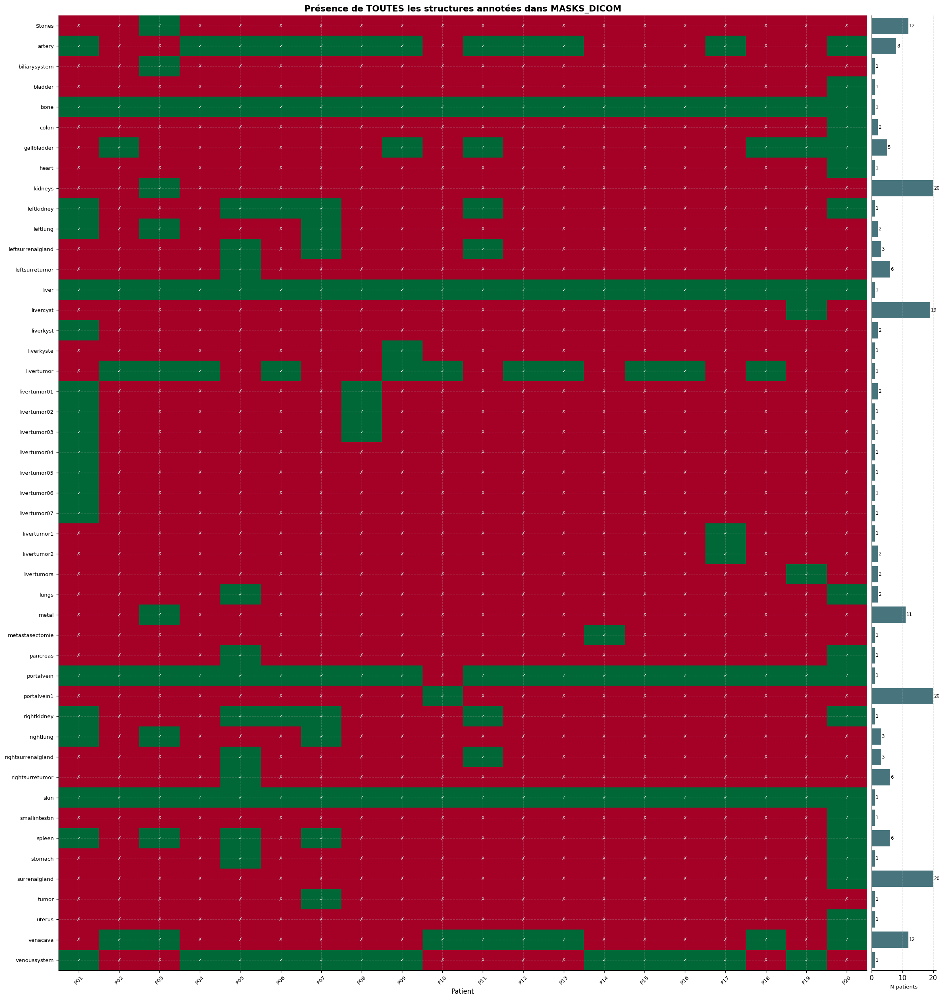

Structure la plus commune  : bone (20/20)
Structure la plus rare     : Stones (1/20)


In [ ]:
# ── Heatmap de présence : TOUTES les structures × patients ───────────────────
all_names_sorted = sorted(all_structure_names)
presence_matrix  = np.zeros((len(all_names_sorted), 20), dtype=int)

for j, pid in enumerate(ALL_PIDS):
    for i, name in enumerate(all_names_sorted):
        if name in structure_registry.get(pid, []):
            presence_matrix[i, j] = 1

fig, ax = plt.subplots(figsize=(20, max(6, len(all_names_sorted)*0.45)))
im = ax.imshow(presence_matrix, cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
ax.set_xticks(range(20))
ax.set_xticklabels([f'P{p:02d}' for p in ALL_PIDS], fontsize=8, rotation=45)
ax.set_yticks(range(len(all_names_sorted)))
ax.set_yticklabels(all_names_sorted, fontsize=8)
ax.set_title('Présence de TOUTES les structures annotées dans MASKS_DICOM', fontsize=13, fontweight='bold')
ax.set_xlabel('Patient')

# Annotations
for i in range(len(all_names_sorted)):
    for j in range(20):
        ax.text(j, i, '✓' if presence_matrix[i,j] else '✗',
                ha='center', va='center', fontsize=7,
                color='white' if presence_matrix[i,j] else '#cccccc')

# Barre de fréquence à droite
divider = make_axes_locatable(ax)
ax_freq = divider.append_axes("right", size="8%", pad=0.1)
freqs   = presence_matrix.sum(axis=1)
ax_freq.barh(range(len(all_names_sorted)), freqs, color=PALETTE['primary'], alpha=0.8)
ax_freq.set_ylim(-0.5, len(all_names_sorted)-0.5)
ax_freq.set_xticks([0, 10, 20])
ax_freq.set_xlabel('N patients', fontsize=8)
ax_freq.set_yticks([])
for i, f in enumerate(freqs):
    ax_freq.text(f + 0.2, i, str(f), va='center', fontsize=7)

plt.tight_layout()
plt.savefig('fig_00_all_structures_heatmap.png', bbox_inches='tight', dpi=130)
plt.show()
print(f"Structure la plus commune  : {all_names_sorted[freqs.argmax()]} ({freqs.max()}/20)")
print(f"Structure la plus rare     : {all_names_sorted[freqs.argmin()]} ({freqs.min()}/20)")


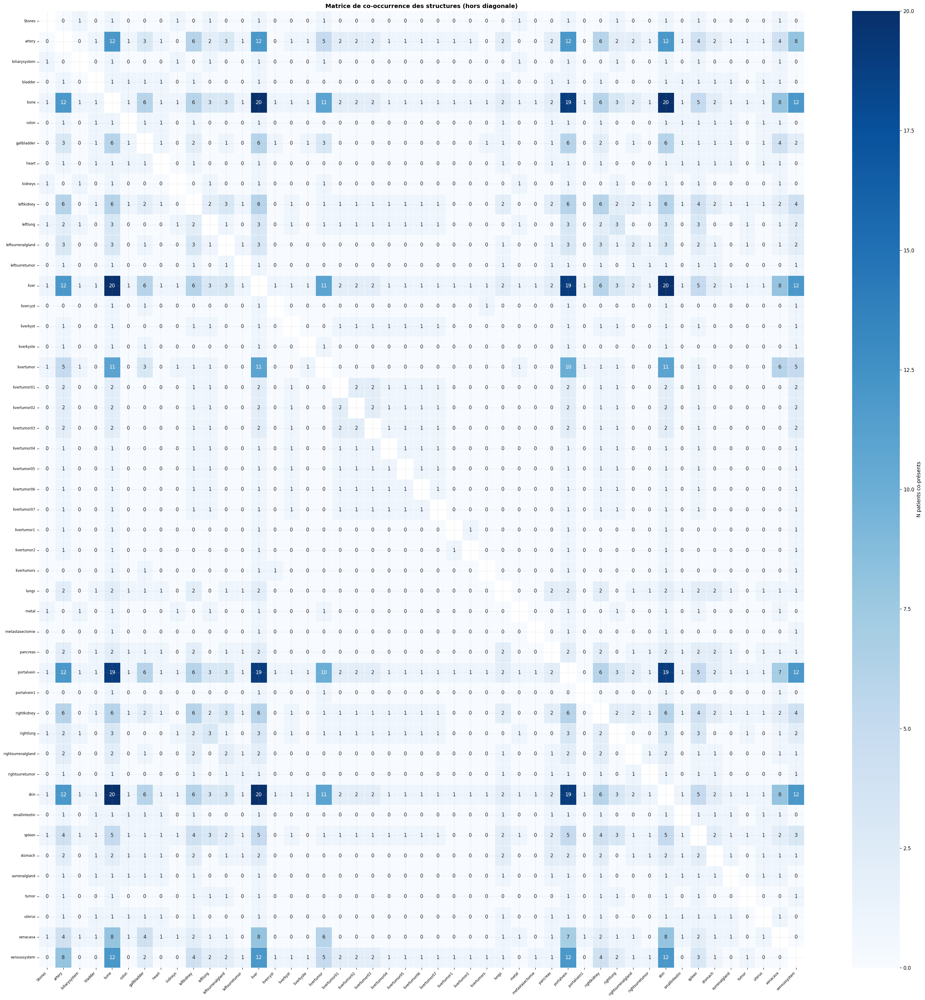

In [ ]:
# ── Matrice de co-occurrence des structures ───────────────────────────────────
# Quelles structures apparaissent toujours ensemble ?
names_list = all_names_sorted
n = len(names_list)
cooc = np.zeros((n, n), dtype=int)

for pid in ALL_PIDS:
    pnames = set(structure_registry.get(pid, []))
    for i, a in enumerate(names_list):
        for j, b in enumerate(names_list):
            if a in pnames and b in pnames:
                cooc[i, j] += 1

fig, ax = plt.subplots(figsize=(max(10, n*0.6), max(10, n*0.6)))
mask_diag = np.eye(n, dtype=bool)
sns.heatmap(cooc, annot=True, fmt='d', cmap='Blues',
            xticklabels=names_list, yticklabels=names_list,
            ax=ax, linewidths=0.3, linecolor='white',
            mask=mask_diag, cbar_kws={'label': 'N patients co-présents'})
ax.set_title('Matrice de co-occurrence des structures (hors diagonale)', fontsize=12, fontweight='bold')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=7)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=7)
plt.tight_layout()
plt.savefig('fig_00b_cooccurrence_matrix.png', bbox_inches='tight', dpi=130)
plt.show()


## 1. Chargement systématique — 20 patients

In [ ]:
# ── Fonctions de chargement DICOM ─────────────────────────────────────────────
def get_patient_dir(pid: int) -> Path:
    return BASE_DATA_DIR / f"3Dircadb1.{pid}"

def load_dicom_series(folder: Path) -> Tuple[Optional[np.ndarray], Optional[sitk.Image]]:
    if not folder.exists():
        return None, None
    try:
        reader = sitk.ImageSeriesReader()
        names  = reader.GetGDCMSeriesFileNames(str(folder))
        if not names:
            return None, None
        reader.SetFileNames(names)
        image = reader.Execute()
        vol   = sitk.GetArrayFromImage(image).astype(np.int16)
        return vol, image
    except Exception as e:
        print(f"  ⚠ Erreur chargement {folder.name} : {e}")
        return None, None

def sitk_image_to_infos(image: sitk.Image) -> dict:
    sp = image.GetSpacing()
    sz = image.GetSize()
    return {
        'spacing_xyz' : (float(sp[0]), float(sp[1]), float(sp[2])),
        'spacing_zyx' : (float(sp[2]), float(sp[1]), float(sp[0])),
        'origin'      : tuple(image.GetOrigin()),
        'direction'   : tuple(image.GetDirection()),
        'size_xyz'    : (int(sz[0]), int(sz[1]), int(sz[2])),
        'shape_zyx'   : (int(sz[2]), int(sz[1]), int(sz[0])),
        'n_slices'    : int(sz[2]),
    }

def are_spatially_compatible(img_ref: sitk.Image, img_mask: sitk.Image,
                              tol_origin: float = 0.5) -> Tuple[bool, str]:
    sz_ref  = img_ref.GetSize()
    sz_mask = img_mask.GetSize()
    if sz_ref != sz_mask:
        return False, f'shape mismatch ref={sz_ref} mask={sz_mask}'
    orig_ref  = np.array(img_ref.GetOrigin())
    orig_mask = np.array(img_mask.GetOrigin())
    dist_orig = float(np.linalg.norm(orig_ref - orig_mask))
    if dist_orig > tol_origin:
        return False, f'origin mismatch Δ={dist_orig:.2f}mm'
    dir_ref  = np.array(img_ref.GetDirection())
    dir_mask = np.array(img_mask.GetDirection())
    if not np.allclose(dir_ref, dir_mask, atol=1e-4):
        return False, 'direction cosines mismatch'
    return True, 'OK'

def load_mask_binary(folder: Path, structure: str) -> Tuple[Optional[np.ndarray], Optional[sitk.Image]]:
    mask_dir = folder / 'MASKS_DICOM' / structure
    vol, img = load_dicom_series(mask_dir)
    if vol is not None:
        vol = (vol > 0).astype(np.uint8)
    return vol, img

print("Fonctions de chargement définies.")


Fonctions de chargement définies.


In [ ]:
# ── Boucle de chargement systématique ─────────────────────────────────────────
VASCULAR_TYPES = list(VASCULAR_CANDIDATES.keys())
patient_data   = {}
load_report    = []

for pid in ALL_PIDS:
    pdir   = get_patient_dir(pid)
    entry  = {'pid': pid, 'pdir': pdir}
    report = {'pid': pid, 'ct': False, 'liver': False}
    print(f"\n── Patient {pid:02d} ──")

    if not pdir.exists():
        print(f"  ✗ Dossier manquant")
        entry['status'] = 'missing_dir'
        for vt in VASCULAR_TYPES: report[vt] = False
        patient_data[pid] = entry
        load_report.append(report)
        continue

    # CT
    ct, ct_img = load_dicom_series(pdir / 'PATIENT_DICOM')
    entry['ct'] = ct; entry['ct_img'] = ct_img
    if ct is not None:
        infos = sitk_image_to_infos(ct_img)
        entry['infos'] = infos
        report['ct'] = True
        print(f"  ✓ CT   shape={ct.shape}  spacing={tuple(round(x,3) for x in infos['spacing_xyz'])}  HU=[{ct.min()},{ct.max()}]")
    else:
        entry['infos'] = None
        print(f"  ✗ CT non chargé")

    # Foie
    ml, ml_img = load_mask_binary(pdir, 'liver')
    entry['mask_liver'] = ml; entry['mask_liver_img'] = ml_img
    if ml is not None:
        report['liver'] = True
        if ct_img and ml_img:
            compat, reason = are_spatially_compatible(ct_img, ml_img)
            entry['compat_liver'] = (compat, reason)
            print(f"  ✓ Foie  vx={ml.sum():,}  [{'✓' if compat else '⚠'} {reason}]")
        else:
            entry['compat_liver'] = (None, 'CT absent')
    else:
        entry['compat_liver'] = (False, 'masque absent')
        print(f"  ✗ Masque foie manquant")

    # Masques vasculaires
    for vtype in VASCULAR_TYPES:
        found_name = resolve_vascular_mask(pid, vtype)
        if found_name:
            mv, mv_img = load_mask_binary(pdir, found_name)
        else:
            mv, mv_img = None, None
        entry[f'mask_{vtype}'] = mv
        entry[f'img_{vtype}']  = mv_img
        entry[f'label_{vtype}'] = found_name
        if mv is not None:
            report[vtype] = True
            if ct_img and mv_img:
                compat, reason = are_spatially_compatible(ct_img, mv_img)
                entry[f'compat_{vtype}'] = (compat, reason)
                print(f"  ✓ {vtype:<15} vx={mv.sum():,}  (alias='{found_name}')  [{'✓' if compat else '⚠'} {reason}]")
            else:
                entry[f'compat_{vtype}'] = (None, 'CT absent')
                print(f"  ✓ {vtype:<15} vx={mv.sum():,}  (alias='{found_name}')")
        else:
            entry[f'compat_{vtype}'] = (None, 'absent')
            report[vtype] = False

    # Structures disponibles
    entry['structures'] = structure_registry.get(pid, [])
    patient_data[pid]   = entry
    load_report.append(report)

print("\n Chargement terminé.")



── Patient 01 ──
  ✓ CT   shape=(129, 512, 512)  spacing=(0.57, 0.57, 1.6)  HU=[-1024,1023]
  ✓ Foie  vx=2,865,131  [✓ OK]
  ✓ artery          vx=114,923  (alias='artery')  [✓ OK]
  ✓ portalvein      vx=103,533  (alias='portalvein')  [✓ OK]
  ✓ venous          vx=143,180  (alias='venoussystem')  [✓ OK]

── Patient 02 ──
  ✓ CT   shape=(172, 512, 512)  spacing=(0.782, 0.782, 1.6)  HU=[-1024,1023]
  ✓ Foie  vx=1,648,024  [✓ OK]
  ✓ portalvein      vx=12,012  (alias='portalvein')  [✓ OK]
  ✓ venacava        vx=52,296  (alias='venacava')  [✓ OK]

── Patient 03 ──
  ✓ CT   shape=(200, 512, 512)  spacing=(0.625, 0.625, 1.25)  HU=[-1024,3071]
  ✓ Foie  vx=2,375,079  [✓ OK]
  ✓ portalvein      vx=79,298  (alias='portalvein')  [✓ OK]
  ✓ venacava        vx=107,699  (alias='venacava')  [✓ OK]

── Patient 04 ──
  ✓ CT   shape=(91, 512, 512)  spacing=(0.742, 0.742, 2.0)  HU=[-1024,1023]
  ✓ Foie  vx=1,132,427  [✓ OK]
  ✓ artery          vx=64,213  (alias='artery')  [✓ OK]
  ✓ portalvein      vx=7

In [ ]:
# ── Tableau de chargement ─────────────────────────────────────────────────────
df_load = pd.DataFrame(load_report).set_index('pid')
df_load.columns = ['CT','Foie','Artère','V. porte','Sys. veineux','V. hépatiques','V. cave']

print("Rapport de chargement :")
display(df_load.replace({True:'✓', False:'✗'}).style.applymap(
    lambda v: 'background-color:#d4edda' if v=='✓' else 'background-color:#f8d7da'))

# Statistiques de chargement
cols_vx   = ['Artère','V. porte','Sys. veineux']
n_core_ok = df_load[['CT','Foie','V. porte']].all(axis=1).sum()
n_2vx     = (df_load[cols_vx].sum(axis=1) >= 2).sum()
n_3vx     = (df_load[cols_vx].sum(axis=1) == 3).sum()
print(f"\n  CT + Foie + V. porte   : {n_core_ok}/20")
print(f"  ≥2 masques vasculaires : {n_2vx}/20")
print(f"  3  masques vasculaires : {n_3vx}/20")


Rapport de chargement :


,CT,Foie,Artère,V. porte,Sys. veineux,V. hépatiques,V. cave
pid,,,,,,,
1,✓,✓,✓,✓,✓,✗,✗
2,✓,✓,✗,✓,✗,✗,✓
3,✓,✓,✗,✓,✗,✗,✓
4,✓,✓,✓,✓,✓,✗,✗
5,✓,✓,✓,✓,✓,✗,✗
6,✓,✓,✓,✓,✓,✗,✗
7,✓,✓,✓,✓,✓,✗,✗
8,✓,✓,✓,✓,✓,✗,✗
9,✓,✓,✓,✓,✓,✗,✗



  CT + Foie + V. porte   : 19/20
  ≥2 masques vasculaires : 16/20
  3  masques vasculaires : 8/20


## 1b. Rapport de cohérence spatiale des masques

In [ ]:
# ── Compatibilité spatiale ────────────────────────────────────────────────────
compat_rows = []
for pid in ALL_PIDS:
    entry = patient_data.get(pid, {})
    row   = {'patient': pid}
    c_liv = entry.get('compat_liver', (None, 'N/A'))
    row['foie_compat'] = c_liv[0]; row['foie_reason'] = c_liv[1]
    for vtype in VASCULAR_TYPES:
        c = entry.get(f'compat_{vtype}', (None, 'N/A'))
        row[f'{vtype}_compat'] = c[0]; row[f'{vtype}_reason'] = c[1]
    compat_rows.append(row)

df_compat = pd.DataFrame(compat_rows).set_index('patient')

bool_cols    = ['foie_compat'] + [f'{vt}_compat' for vt in VASCULAR_TYPES]
compat_disp  = df_compat[bool_cols].copy()
compat_disp.columns = ['Foie','Artère','V. porte','Sys. veineux','V. hépatiques','V. cave']

def color_compat(val):
    if val is True:  return 'background-color:#d4edda'
    if val is False: return 'background-color:#f8d7da'
    return 'background-color:#f0f0f0'

print("Compatibilité spatiale masques ↔ CT :")
display(compat_disp.style.applymap(color_compat))
problems = [(pid, vtype, entry.get(f'compat_{vtype}',(None,''))[1])
            for pid in ALL_PIDS
            for vtype in ['liver']+VASCULAR_TYPES
            for entry in [patient_data.get(pid,{})]
            if entry.get(f'compat_{vtype}' if vtype!='liver' else 'compat_liver',
                         (None,''))[0] is False]
if problems:
    print("\n⚠ Incompatibilités :")
    for pid, vt, reason in problems:
        print(f"  P{pid:02d} {vt}: {reason}")
else:
    print("\n✓ Aucune incompatibilité spatiale détectée.")


NameError: name 'patient_data' is not defined

## 2. Analyse géométrique — Spacing, anisotropie, shape

In [ ]:
# ── Tableau géométrique ───────────────────────────────────────────────────────
geom_rows = []
for pid in ALL_PIDS:
    meta  = IRCAD_META[pid]
    infos = patient_data.get(pid, {}).get('infos')
    if infos:
        sx, sy, sz = infos['spacing_xyz']
        nz, ny, nx = infos['shape_zyx']
        source = 'DICOM'
    else:
        sx = sy = meta['vx']; sz = meta['vz']; nz = meta['slices']; ny = nx = 512; source = 'IRCAD-table'
    sxy        = (sx + sy) / 2
    ratio_z_xy = sz / sxy
    geom_rows.append({
        'patient'      : pid, 'sexe': meta['sex'],
        'âge'          : 2010 - meta['birth'],
        'sx_mm': round(sx,3), 'sy_mm': round(sy,3), 'sz_mm': round(sz,3),
        'vox_mm3'      : round(sx*sy*sz, 4),
        'ratio_Z/XY'   : round(ratio_z_xy, 3),
        'nx': nx, 'ny': ny, 'nz': nz,
        'FOV_z_mm'     : round(nz*sz, 1),
        'vol_total_cm3': round(nx*sx*ny*sy*nz*sz/1000, 1),
        'n_tumeurs'    : meta['n_tumors'],
        'drawbacks'    : meta['drawbacks'],
        'source'       : source,
    })

df_geom = pd.DataFrame(geom_rows).set_index('patient')

display(
    df_geom.style
    .background_gradient(subset=['ratio_Z/XY'], cmap='YlOrRd')
    .background_gradient(subset=['sz_mm'],      cmap='Blues')
    .background_gradient(subset=['vox_mm3'],    cmap='Purples')
    .format({'sx_mm':'{:.3f}','sy_mm':'{:.3f}','sz_mm':'{:.3f}',
             'vox_mm3':'{:.4f}','ratio_Z/XY':'{:.2f}'})
)


,sexe,âge,sx_mm,sy_mm,sz_mm,vox_mm3,ratio_Z/XY,nx,ny,nz,FOV_z_mm,vol_total_cm3,n_tumeurs,drawbacks,source
patient,,,,,,,,,,,,,,,
1,F,66,0.570,0.570,1.600,0.5198,2.81,512,512,129,206.400000,17579.200000,7,stomach/pancreas/duodenum,DICOM
2,F,23,0.782,0.782,1.600,0.9784,2.05,512,512,172,275.200000,44116.600000,1,pancreas/duodenum,DICOM
3,M,54,0.625,0.625,1.250,0.4883,2.00,512,512,200,250.000000,25600.000000,1,metal artefact,DICOM
4,M,68,0.742,0.742,2.000,1.1017,2.69,512,512,91,182.000000,26280.800000,7,heart,DICOM
5,M,53,0.782,0.782,1.600,0.9784,2.05,512,512,139,222.400000,35652.400000,0,diaphragm/duodenum,DICOM
6,M,81,0.782,0.782,1.600,0.9784,2.05,512,512,135,216.000000,34626.400000,20,heart,DICOM
7,M,64,0.782,0.782,1.600,0.9784,2.05,512,512,151,241.600000,38730.300000,0,spleen,DICOM
8,F,40,0.561,0.561,1.600,0.5036,2.85,512,512,124,198.400000,16368.400000,3,—,DICOM
9,M,61,0.873,0.873,2.000,1.5244,2.29,512,512,111,222.000000,44357.600000,1,stomach/colon,DICOM


In [ ]:
# ── Stats descriptives géométrie ─────────────────────────────────────────────
geom_num_cols = ['sx_mm','sy_mm','sz_mm','vox_mm3','ratio_Z/XY','nz','FOV_z_mm','vol_total_cm3','âge']

desc = df_geom[geom_num_cols].agg([
    'mean','median','std','min','max',
    lambda x: x.quantile(0.25), lambda x: x.quantile(0.75),
    lambda x: stats.skew(x.dropna()), lambda x: stats.kurtosis(x.dropna()),
])
desc.index = ['Moyenne','Médiane','Écart-type','Min','Max','Q1','Q3','Skewness','Kurtosis']

print("Statistiques descriptives — Paramètres géométriques :")
display(desc.style.format('{:.3f}'))

# IQR
iqr = df_geom[geom_num_cols].quantile(0.75) - df_geom[geom_num_cols].quantile(0.25)
print("\nIQR (Q3−Q1) :")
print(iqr.round(3).to_string())


Statistiques descriptives — Paramètres géométriques :


,sx_mm,sy_mm,sz_mm,vox_mm3,ratio_Z/XY,nz,FOV_z_mm,vol_total_cm3,âge
Moyenne,0.725,0.725,1.778,0.953,2.466,141.150,241.290,33912.055,54.600
Médiane,0.739,0.739,1.600,0.931,2.222,127.000,213.600,30094.100,58.000
Écart-type,0.077,0.077,0.603,0.376,0.858,44.089,84.066,14706.544,13.705
Min,0.561,0.561,1.000,0.462,1.471,74.000,180.800,16368.400,23.000
Max,0.873,0.873,4.000,1.978,5.689,260.000,496.000,77128.200,81.000
Q1,0.694,0.694,1.600,0.765,2.046,121.250,195.200,26110.600,43.000
Q3,0.782,0.782,1.700,1.009,2.528,152.000,248.500,36421.875,64.000
Skewness,-0.549,-0.549,2.638,0.990,2.804,1.250,2.225,1.649,-0.428
Kurtosis,0.112,0.112,7.551,1.012,8.238,1.264,3.843,2.406,-0.127



IQR (Q3−Q1) :
sx_mm                0.089
sy_mm                0.089
sz_mm                0.100
vox_mm3              0.245
ratio_Z/XY           0.482
nz                  30.750
FOV_z_mm            53.300
vol_total_cm3    10311.275
âge                 21.000


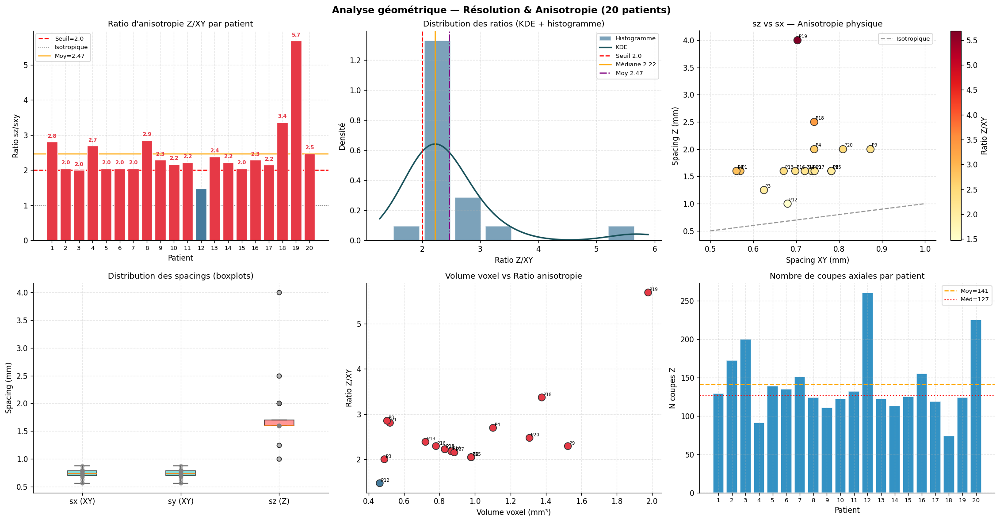

In [ ]:
# ── Figure géométrie complète (4 panels) ──────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(19, 10))
fig.suptitle('Analyse géométrique — Résolution & Anisotropie (20 patients)',
             fontsize=13, fontweight='bold')

pids   = df_geom.index.tolist()
ratios = df_geom['ratio_Z/XY'].values
seuil  = 2.0
colors = ['#E63946' if r >= seuil else '#457B9D' for r in ratios]

# 1. Ratio Z/XY par patient
ax = axes[0, 0]
ax.bar(pids, ratios, color=colors, edgecolor='white', linewidth=0.8, zorder=3)
ax.axhline(seuil, color='red',    linestyle='--', linewidth=1.5, label=f'Seuil={seuil}')
ax.axhline(1.0,   color='gray',   linestyle=':',  linewidth=1,   label='Isotropique')
ax.axhline(np.mean(ratios), color='orange', linestyle='-', linewidth=1.5,
           label=f'Moy={np.mean(ratios):.2f}', alpha=0.8)
ax.set_title('Ratio d\'anisotropie Z/XY par patient')
ax.set_xlabel('Patient'); ax.set_ylabel('Ratio sz/sxy')
ax.set_xticks(pids); ax.set_xticklabels(pids, fontsize=8)
ax.legend(fontsize=8)
for pid, r in zip(pids, ratios):
    if r >= seuil:
        ax.text(pid, r+0.08, f'{r:.1f}', ha='center', va='bottom',
                fontsize=7, color='#E63946', fontweight='bold')

# 2. Distribution ratios (KDE + hist)
ax = axes[0, 1]
ax.hist(ratios, bins=8, color='#457B9D', edgecolor='white', rwidth=0.85,
        alpha=0.7, density=True, label='Histogramme')
kde_x = np.linspace(ratios.min()-0.2, ratios.max()+0.2, 200)
kde   = stats.gaussian_kde(ratios)
ax.plot(kde_x, kde(kde_x), color='#1A535C', lw=2, label='KDE')
ax.axvline(seuil,              color='red',    linestyle='--', label=f'Seuil {seuil}')
ax.axvline(np.median(ratios),  color='orange', linestyle='-',  label=f'Médiane {np.median(ratios):.2f}')
ax.axvline(np.mean(ratios),    color='purple', linestyle='-.',  label=f'Moy {np.mean(ratios):.2f}')
ax.set_xlabel('Ratio Z/XY'); ax.set_ylabel('Densité')
ax.set_title('Distribution des ratios (KDE + histogramme)')
ax.legend(fontsize=8)

# 3. sz vs sx scatter coloré par ratio
ax = axes[0, 2]
sz_vals = df_geom['sz_mm'].values; sx_vals = df_geom['sx_mm'].values
sc = ax.scatter(sx_vals, sz_vals, c=ratios, cmap='YlOrRd', s=100,
                edgecolors='#333', zorder=3)
ax.plot([0.5, 1.0], [0.5, 1.0], 'k--', alpha=0.4, label='Isotropique')
plt.colorbar(sc, ax=ax, label='Ratio Z/XY')
for pid, sx, sz in zip(pids, sx_vals, sz_vals):
    ax.annotate(f'P{pid}', (sx, sz), fontsize=6, ha='left', va='bottom',
                xytext=(2, 2), textcoords='offset points')
ax.set_xlabel('Spacing XY (mm)'); ax.set_ylabel('Spacing Z (mm)')
ax.set_title('sz vs sx — Anisotropie physique')
ax.legend(fontsize=8)

# 4. Boxplots spacings
ax = axes[1, 0]
bp_data = [df_geom['sx_mm'].values, df_geom['sy_mm'].values, df_geom['sz_mm'].values]
bp = ax.boxplot(bp_data, labels=['sx (XY)', 'sy (XY)', 'sz (Z)'],
                patch_artist=True, notch=False)
colors_bp = ['#4ECDC4','#4ECDC4','#FF6B6B']
for patch, color in zip(bp['boxes'], colors_bp):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_ylabel('Spacing (mm)')
ax.set_title('Distribution des spacings (boxplots)')
for i, data in enumerate(bp_data, 1):
    ax.scatter([i]*len(data), data, alpha=0.5, color='gray', s=25, zorder=3)

# 5. Volume voxel vs ratio
ax = axes[1, 1]
ax.scatter(df_geom['vox_mm3'].values, ratios, c=colors, s=90, edgecolors='#333', zorder=3)
ax.set_xlabel('Volume voxel (mm³)'); ax.set_ylabel('Ratio Z/XY')
ax.set_title('Volume voxel vs Ratio anisotropie')
for pid, vox, r in zip(pids, df_geom['vox_mm3'].values, ratios):
    ax.annotate(f'P{pid}', (vox, r), fontsize=6, xytext=(2, 2), textcoords='offset points')

# 6. Nombre de coupes
ax = axes[1, 2]
nz_vals = df_geom['nz'].values
ax.bar(pids, nz_vals, color=[VESSEL_COLORS['portalvein']]*20, alpha=0.8, edgecolor='white')
ax.axhline(np.mean(nz_vals), color='orange', linestyle='--', label=f'Moy={np.mean(nz_vals):.0f}')
ax.axhline(np.median(nz_vals), color='red', linestyle=':', label=f'Méd={np.median(nz_vals):.0f}')
ax.set_xlabel('Patient'); ax.set_ylabel('N coupes Z')
ax.set_title('Nombre de coupes axiales par patient')
ax.set_xticks(pids); ax.set_xticklabels(pids, fontsize=8)
ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig('fig_02_geometry.png', bbox_inches='tight', dpi=130)
plt.show()


## 3. Visualisation systématique — Grille coupes CT + overlays

In [ ]:
# ── Utilitaires de visualisation ─────────────────────────────────────────────
WC, WW     = 60, 350
VMIN, VMAX = WC - WW//2, WC + WW//2

def get_best_slice(pid: int) -> int:
    entry = patient_data.get(pid, {})
    ct    = entry.get('ct')
    if ct is None: return 0
    vessel_sum = None
    for vtype in VASCULAR_TYPES:
        m = entry.get(f'mask_{vtype}')
        if m is not None:
            s = m.sum(axis=(1,2))
            vessel_sum = s if vessel_sum is None else vessel_sum + s
    if vessel_sum is not None and vessel_sum.max() > 0:
        return int(vessel_sum.argmax())
    ml = entry.get('mask_liver')
    if ml is not None and ml.sum() > 0:
        return int(ndimage.center_of_mass(ml)[0])
    return ct.shape[0] // 2

def make_contour_overlay(ax, mask2d, color, linewidth=1.5):
    if mask2d is None or mask2d.sum() == 0: return
    for c in sk_measure.find_contours(mask2d.astype(float), level=0.5):
        ax.plot(c[:, 1], c[:, 0], color=color, linewidth=linewidth)

print("Utilitaires de visualisation prêts.")


Utilitaires de visualisation prêts.


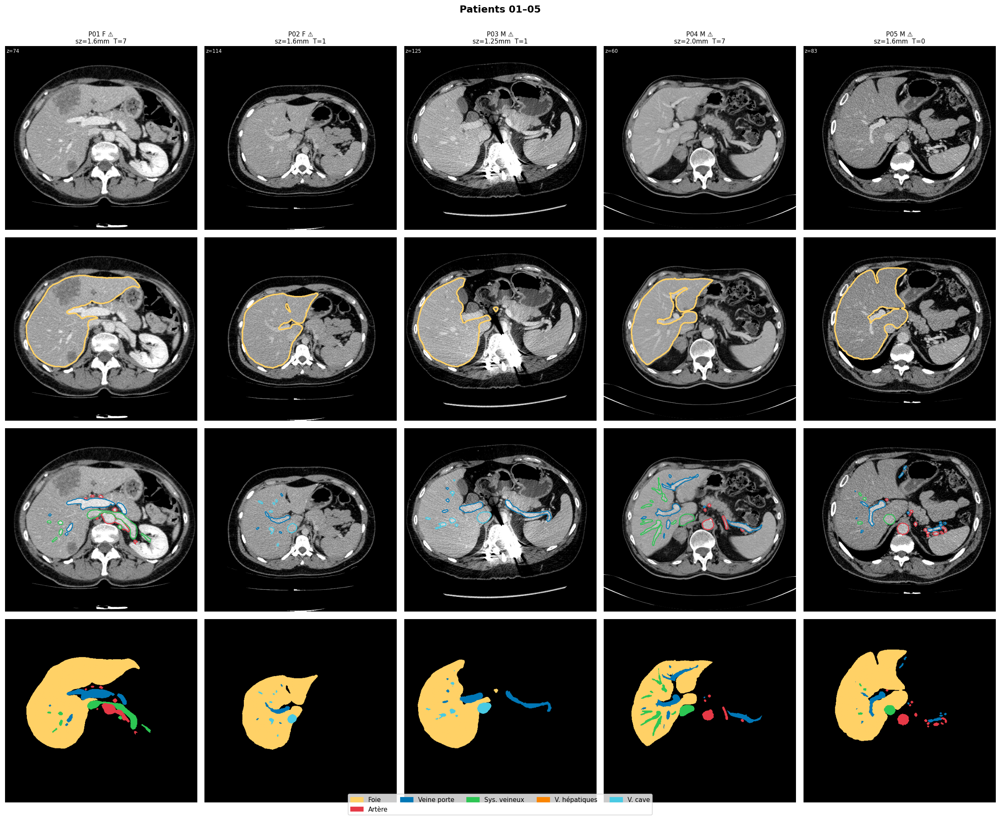

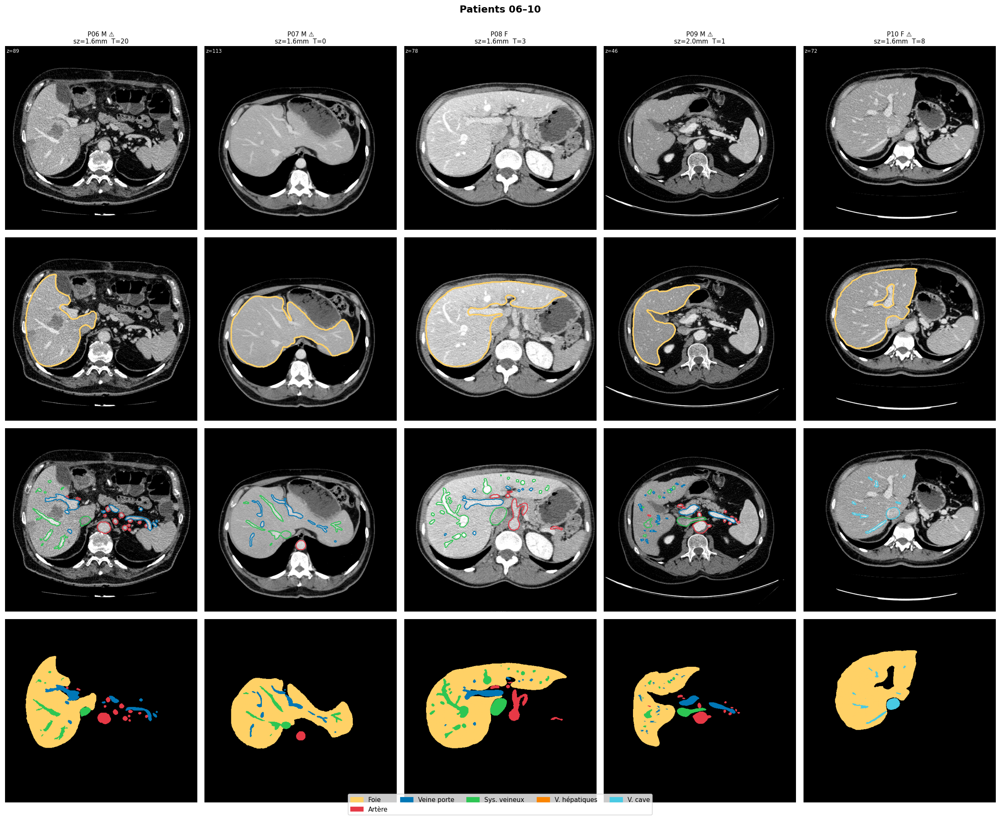

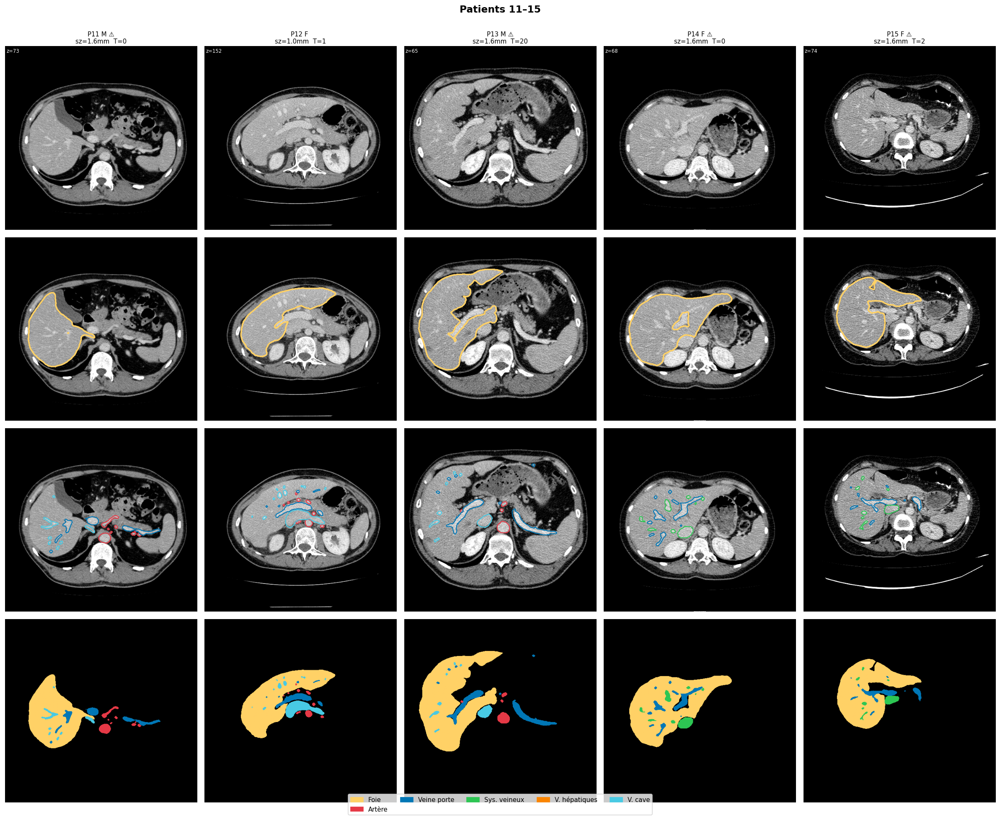

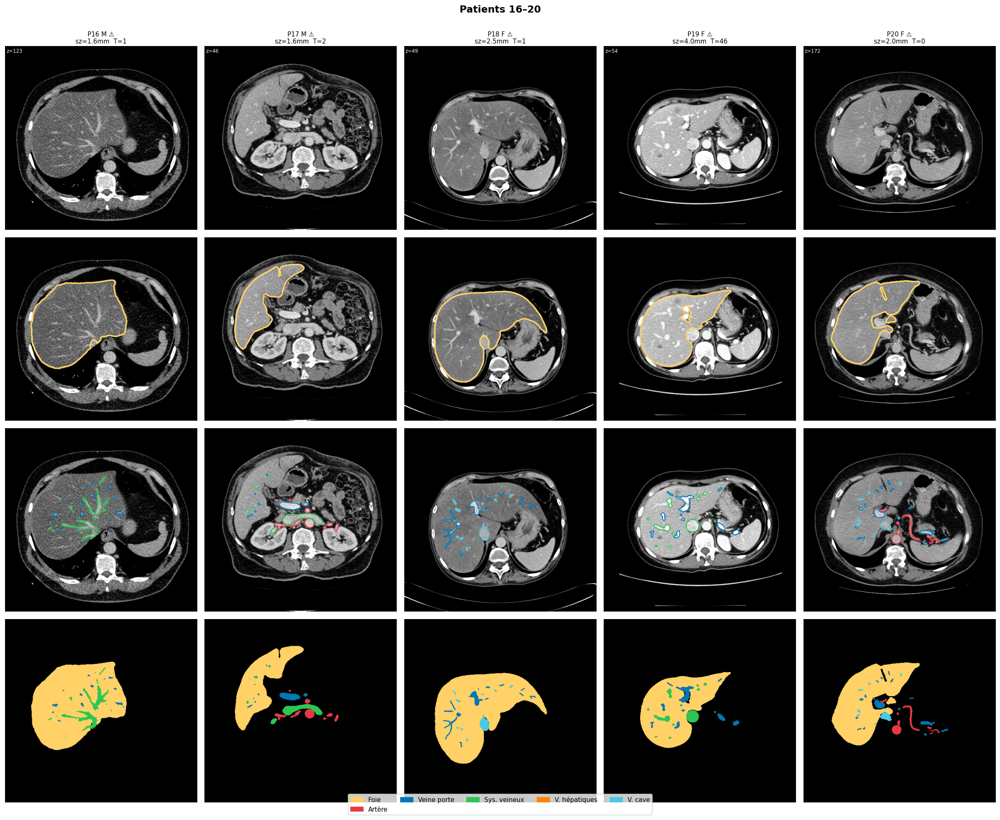

In [ ]:
# ── Grille 4 lignes × 5 patients ─────────────────────────────────────────────
PATIENTS_PER_FIGURE = 5
N_ROWS              = 4
ROW_LABELS = [
    '① CT (fenêtrage abdo)',
    '② CT + contour foie',
    '③ CT + overlay vaisseaux',
    '④ Masques vasculaires seuls',
]

for fig_idx in range(4):
    pid_range = ALL_PIDS[fig_idx*PATIENTS_PER_FIGURE:(fig_idx+1)*PATIENTS_PER_FIGURE]
    fig, axes = plt.subplots(N_ROWS, PATIENTS_PER_FIGURE,
                              figsize=(4*PATIENTS_PER_FIGURE, 4*N_ROWS))
    fig.suptitle(f'Patients {pid_range[0]:02d}–{pid_range[-1]:02d}',
                 fontsize=14, fontweight='bold', y=1.002)
    for row, lbl in enumerate(ROW_LABELS):
        axes[row, 0].set_ylabel(lbl, fontsize=8, labelpad=6, fontweight='bold')

    for col_idx, pid in enumerate(pid_range):
        entry = patient_data.get(pid, {})
        ct    = entry.get('ct')
        meta  = IRCAD_META[pid]
        zc    = get_best_slice(pid)
        artef = '⚠' if meta['drawbacks'] not in ['—',''] else ''
        axes[0, col_idx].set_title(
            f'P{pid:02d} {meta["sex"]} {artef}\nsz={meta["vz"]}mm  T={meta["n_tumors"]}',
            fontsize=9, pad=4)
        if ct is None:
            for row in range(N_ROWS):
                axes[row, col_idx].text(0.5, 0.5, 'DICOM\nmanquant',
                    ha='center', va='center', transform=axes[row, col_idx].transAxes,
                    fontsize=11, color='gray')
                axes[row, col_idx].axis('off')
            continue
        img2d = ct[zc]
        ml    = entry.get('mask_liver')
        ml2d  = ml[zc] if ml is not None else None

        # ① CT brut
        ax = axes[0, col_idx]
        ax.imshow(img2d, cmap='gray', vmin=VMIN, vmax=VMAX, aspect='auto')
        ax.text(3, 5, f'z={zc}', color='white', fontsize=7, va='top')
        ax.axis('off')

        # ② CT + contour foie
        ax = axes[1, col_idx]
        ax.imshow(img2d, cmap='gray', vmin=VMIN, vmax=VMAX, aspect='auto')
        make_contour_overlay(ax, ml2d, LIVER_COLOR, linewidth=2)
        ax.axis('off')

        # ③ CT + overlay vaisseaux
        ax = axes[2, col_idx]
        ax.imshow(img2d, cmap='gray', vmin=VMIN, vmax=VMAX, aspect='auto')
        for vtype, color in VESSEL_COLORS.items():
            mv = entry.get(f'mask_{vtype}')
            if mv is not None and mv.shape[0] > zc:
                make_contour_overlay(ax, mv[zc], color, linewidth=1.2)
        ax.axis('off')

        # ④ Masques seuls
        ax = axes[3, col_idx]
        overlay = np.zeros((*img2d.shape, 3))
        if ml2d is not None:
            overlay[ml2d > 0] = matplotlib.colors.to_rgb(LIVER_COLOR)
        for vtype, color in VESSEL_COLORS.items():
            mv = entry.get(f'mask_{vtype}')
            if mv is not None and mv.shape[0] > zc:
                mv2d = mv[zc]
                if mv2d.sum() > 0:
                    overlay[mv2d > 0] = matplotlib.colors.to_rgb(color)
        ax.imshow(overlay, aspect='auto')
        ax.axis('off')
    patches = [
        mpatches.Patch(color=LIVER_COLOR,                   label='Foie'),
        mpatches.Patch(color=VESSEL_COLORS['artery'],       label='Artère'),
        mpatches.Patch(color=VESSEL_COLORS['portalvein'],   label='Veine porte'),
        mpatches.Patch(color=VESSEL_COLORS['venous'],       label='Sys. veineux'),
        mpatches.Patch(color=VESSEL_COLORS['hepaticveins'], label='V. hépatiques'),
        mpatches.Patch(color=VESSEL_COLORS['venacava'],     label='V. cave')
    ]
    fig.legend(handles=patches, loc='lower center', ncol=5, fontsize=9,
               frameon=True, bbox_to_anchor=(0.5, -0.01))

    plt.tight_layout()
    plt.savefig(f'fig_03_grid_p{fig_idx+1}.png', bbox_inches='tight', dpi=110)
    plt.show()


## 4. Statistiques exhaustives des masques

In [ ]:
# ── Calcul statistiques masques ───────────────────────────────────────────────
def voxels_to_cm3(n_voxels, spacing_xyz):
    sx, sy, sz = spacing_xyz
    return n_voxels * sx * sy * sz / 1000

def mask_stats(mask):
    if mask is None or mask.sum() == 0:
        return {'voxels':0,'present':False,'n_components':0,'n_slices':0,
                'bbox_z':(0,0),'bbox_slices':0,'density':0.0}
    n_vox       = int(mask.sum())
    labeled, nc = ndimage.label(mask)
    per_slice   = mask.sum(axis=(1,2)) > 0
    n_slices    = int(per_slice.sum())
    nonzero_z   = np.where(per_slice)[0]
    bbox_z      = (int(nonzero_z[0]), int(nonzero_z[-1]))
    bbox_slices = bbox_z[1] - bbox_z[0] + 1
    density     = round(n_slices / mask.shape[0] * 100, 1)
    return {'voxels':n_vox,'present':True,'n_components':nc,'n_slices':n_slices,
            'bbox_z':bbox_z,'bbox_slices':bbox_slices,'density':density}

stats_rows = []
for pid in ALL_PIDS:
    entry = patient_data.get(pid, {})
    meta  = IRCAD_META[pid]
    infos = entry.get('infos')
    sp    = infos['spacing_xyz'] if infos else (meta['vx'], meta['vx'], meta['vz'])

    ml    = entry.get('mask_liver')
    s_liv = mask_stats(ml)

    vessel_stats = {}
    fusion_mask  = None
    for vtype in VASCULAR_TYPES:
        m = entry.get(f'mask_{vtype}')
        vessel_stats[vtype]         = mask_stats(m)
        vessel_stats[f'{vtype}_cm3'] = voxels_to_cm3(vessel_stats[vtype]['voxels'], sp)
        if m is not None:
            fusion_mask = m if fusion_mask is None else np.logical_or(fusion_mask, m).astype(np.uint8)

    s_fus = mask_stats(fusion_mask)
    n_vx_present = sum(1 for vt in VASCULAR_TYPES if vessel_stats[vt]['present'])

    # Chevauchement inter-masques
    avail = {vt: entry.get(f'mask_{vt}') for vt in VASCULAR_TYPES if entry.get(f'mask_{vt}') is not None}
    vt_list = list(avail.keys())
    max_ov_pct, ov_pair = 0.0, '—'
    for i in range(len(vt_list)):
        for j in range(i+1, len(vt_list)):
            m1, m2 = avail[vt_list[i]], avail[vt_list[j]]
            inter  = int(np.logical_and(m1, m2).sum())
            min_v  = min(m1.sum(), m2.sum())
            if min_v > 0:
                ov = 100 * inter / min_v
                if ov > max_ov_pct:
                    max_ov_pct = ov; ov_pair = f'{vt_list[i][:3]}/{vt_list[j][:3]}'

    stats_rows.append({
        'patient'         : pid,
        'foie_cm3'        : round(voxels_to_cm3(s_liv['voxels'], sp), 2),
        'foie_composantes': s_liv['n_components'],
        'foie_slices'     : s_liv['n_slices'],
        'foie_density_pct': s_liv['density'],
        'artery_cm3'      : round(vessel_stats['artery_cm3'], 3),
        'artery_comp'     : vessel_stats['artery']['n_components'],
        'artery_slices'   : vessel_stats['artery']['n_slices'],
        'portal_cm3'      : round(vessel_stats['portalvein_cm3'], 3),
        'portal_comp'     : vessel_stats['portalvein']['n_components'],
        'portal_slices'   : vessel_stats['portalvein']['n_slices'],
        'venous_cm3'      : round(vessel_stats['venous_cm3'], 3),
        'venous_comp'     : vessel_stats['venous']['n_components'],
        'venous_slices'   : vessel_stats['venous']['n_slices'],
        'hepatic_cm3'     : round(vessel_stats['hepaticveins_cm3'], 3),
        'hepatic_comp'    : vessel_stats['hepaticveins']['n_components'],
        'venacava_cm3'    : round(vessel_stats['venacava_cm3'], 3),
        'venacava_comp'   : vessel_stats['venacava']['n_components'],
        'fusion_cm3'      : round(voxels_to_cm3(s_fus['voxels'], sp), 3),
        'n_vx_present'    : n_vx_present,
        'overlap_max_pct' : round(max_ov_pct, 2),
        'overlap_pair'    : ov_pair,
    })

df_stats = pd.DataFrame(stats_rows).set_index('patient')
print("Tableau des statistiques de masques :")
display(df_stats.style.background_gradient(subset=['foie_cm3'], cmap='YlGn')
                      .background_gradient(subset=['portal_cm3'], cmap='Blues')
                      .format({c:'{:.3f}' for c in df_stats.select_dtypes(float).columns}))


Tableau des statistiques de masques :


,foie_cm3,foie_composantes,foie_slices,foie_density_pct,artery_cm3,artery_comp,artery_slices,portal_cm3,portal_comp,portal_slices,venous_cm3,venous_comp,venous_slices,hepatic_cm3,hepatic_comp,venacava_cm3,venacava_comp,fusion_cm3,n_vx_present,overlap_max_pct,overlap_pair
patient,,,,,,,,,,,,,,,,,,,,,
1,1489.410,4,98,76.000,59.742,1,129,53.821,1,116,74.431,1,129,0.000,0,0.000,0,187.993,3,0.000,—
2,1612.490,1,114,66.300,0.000,0,0,11.753,1,44,0.000,0,0,0.000,0,51.168,1,62.921,2,0.000,—
3,1159.710,1,123,61.500,0.000,0,0,38.720,19,173,0.000,0,0,0.000,0,52.587,9,91.307,2,0.000,—
4,1247.580,1,67,73.600,70.743,1,91,82.880,1,77,158.657,2,91,0.000,0,0.000,0,312.280,3,0.000,—
5,2078.700,1,119,85.600,113.210,1,139,60.442,5,127,100.477,19,130,0.000,0,0.000,0,274.129,3,0.000,—
6,1789.070,1,96,71.100,140.657,2,135,94.012,1,122,156.643,8,135,0.000,0,0.000,0,391.313,3,0.000,—
7,1430.420,1,98,64.900,96.502,5,151,58.238,6,115,162.207,7,145,0.000,0,0.000,0,316.940,3,0.010,por/ven
8,1618.970,1,116,93.500,60.563,1,124,27.275,1,89,193.964,49,124,0.000,0,0.000,0,281.695,3,0.230,art/por
9,1929.030,2,89,80.200,259.472,7,111,89.506,2,79,188.769,11,105,0.000,0,0.000,0,537.360,3,0.120,art/ven


In [ ]:
# ── Statistiques descriptives complètes des volumes ───────────────────────────
vol_cols = ['foie_cm3','artery_cm3','portal_cm3','venous_cm3','hepatic_cm3','venacava_cm3','fusion_cm3']

def full_desc(series):
    s = series.replace(0, np.nan).dropna()
    if len(s) == 0:
        return pd.Series({'N':0,'Moy':np.nan,'Méd':np.nan,'Std':np.nan,
                          'Min':np.nan,'Max':np.nan,'Q1':np.nan,'Q3':np.nan,
                          'IQR':np.nan,'CV%':np.nan,'Skew':np.nan,'Kurt':np.nan,'P5':np.nan,'P95':np.nan})
    return pd.Series({
        'N'   : len(s),
        'Moy' : round(s.mean(), 3),
        'Méd' : round(s.median(), 3),
        'Std' : round(s.std(), 3),
        'Min' : round(s.min(), 3),
        'Max' : round(s.max(), 3),
        'Q1'  : round(s.quantile(0.25), 3),
        'Q3'  : round(s.quantile(0.75), 3),
        'IQR' : round(s.quantile(0.75)-s.quantile(0.25), 3),
        'CV%' : round(s.std()/s.mean()*100, 1),
        'Skew': round(stats.skew(s), 3),
        'Kurt': round(stats.kurtosis(s), 3),
        'P5'  : round(s.quantile(0.05), 3),
        'P95' : round(s.quantile(0.95), 3),
    })

desc_vols = pd.DataFrame({col: full_desc(df_stats[col]) for col in vol_cols})
print("Statistiques descriptives complètes des volumes (cm³) [patients avec masque présent uniquement] :")
display(desc_vols.T.style.format('{:.3f}', na_rep='—')
        .background_gradient(subset=['CV%'], cmap='RdYlGn_r'))

print("\n💡 CV% = Coefficient de variation (Std/Moy×100) — mesure la dispersion relative")
print("   Skew > 0 → distribution asymétrique à droite (quelques grands volumes)")


Statistiques descriptives complètes des volumes (cm³) [patients avec masque présent uniquement] :


,N,Moy,Méd,Std,Min,Max,Q1,Q3,IQR,CV%,Skew,Kurt,P5,P95
foie_cm3,20.000,1585.857,1578.075,278.688,1153.320,2118.120,1392.910,1780.775,387.865,17.600,0.288,-0.700,1159.390,2080.671
artery_cm3,12.000,105.303,94.476,57.471,40.028,259.472,68.198,119.382,51.184,54.600,1.615,2.416,50.871,194.124
portal_cm3,19.000,54.787,53.937,20.650,11.753,94.012,43.030,64.132,21.101,37.700,0.091,-0.160,25.723,89.957
venous_cm3,12.000,130.314,133.467,46.464,65.510,193.964,95.386,164.694,69.309,35.700,-0.028,-1.537,70.417,191.107
hepatic_cm3,0.000,—,—,—,—,—,—,—,—,—,—,—,—,—
venacava_cm3,8.000,88.919,73.934,44.880,51.168,178.593,56.180,103.633,47.453,50.500,1.066,-0.088,51.665,161.014
fusion_cm3,20.000,228.960,226.482,123.724,57.378,537.360,121.165,289.341,168.176,54.000,0.622,0.082,62.644,398.615



💡 CV% = Coefficient de variation (Std/Moy×100) — mesure la dispersion relative
   Skew > 0 → distribution asymétrique à droite (quelques grands volumes)


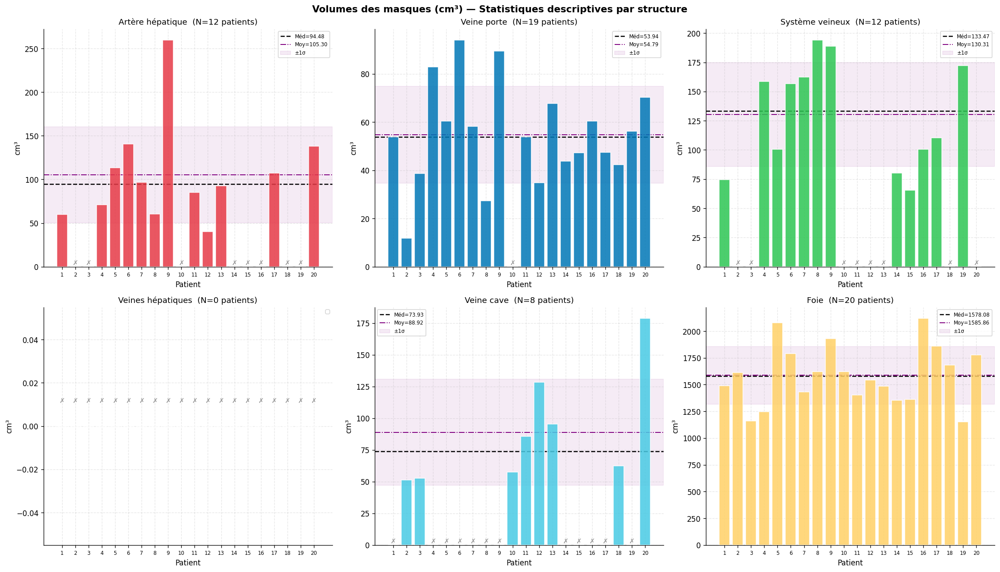

In [ ]:
# ── Figure volumes vasculaires enrichie ───────────────────────────────────────
vol_info = [
    ('artery_cm3',  'Artère hépatique',    VESSEL_COLORS['artery']),
    ('portal_cm3',  'Veine porte',          VESSEL_COLORS['portalvein']),
    ('venous_cm3',  'Système veineux',      VESSEL_COLORS['venous']),
    ('hepatic_cm3', 'Veines hépatiques',    VESSEL_COLORS['hepaticveins']),
    ('venacava_cm3','Veine cave',           VESSEL_COLORS['venacava']),
    ('foie_cm3',    'Foie',                 LIVER_COLOR),
]

fig, axes = plt.subplots(2, 3, figsize=(19, 11))
fig.suptitle('Volumes des masques (cm³) — Statistiques descriptives par structure',
             fontsize=13, fontweight='bold')

pids_all = df_stats.index.tolist()
for ax, (col, label, color) in zip(axes.ravel(), vol_info):
    vals = df_stats[col].replace(0, np.nan).values
    bars = ax.bar(pids_all, np.nan_to_num(vals), color=color, edgecolor='white', alpha=0.85, zorder=3)

    # Marqueurs absents
    for p, v in zip(pids_all, vals):
        if np.isnan(v):
            ax.text(p, 0.01, '✗', ha='center', va='bottom', fontsize=9, color='#999')

    # Lignes stats
    valid = vals[~np.isnan(vals)]
    if len(valid) > 0:
        med = np.median(valid); moy = np.mean(valid); std = np.std(valid)
        ax.axhline(med, color='black',  linestyle='--', lw=1.5, label=f'Méd={med:.2f}')
        ax.axhline(moy, color='purple', linestyle='-.',  lw=1.2, label=f'Moy={moy:.2f}')
        ax.axhspan(max(0, moy-std), moy+std, alpha=0.08, color='purple', label=f'±1σ')
    ax.set_title(f'{label}  (N={int(sum(~np.isnan(vals)))} patients)')
    ax.set_xlabel('Patient'); ax.set_ylabel('cm³')
    ax.set_xticks(pids_all); ax.set_xticklabels(pids_all, fontsize=7)
    ax.legend(fontsize=7)

plt.tight_layout()
plt.savefig('fig_04_vessel_volumes.png', bbox_inches='tight', dpi=130)
plt.show()


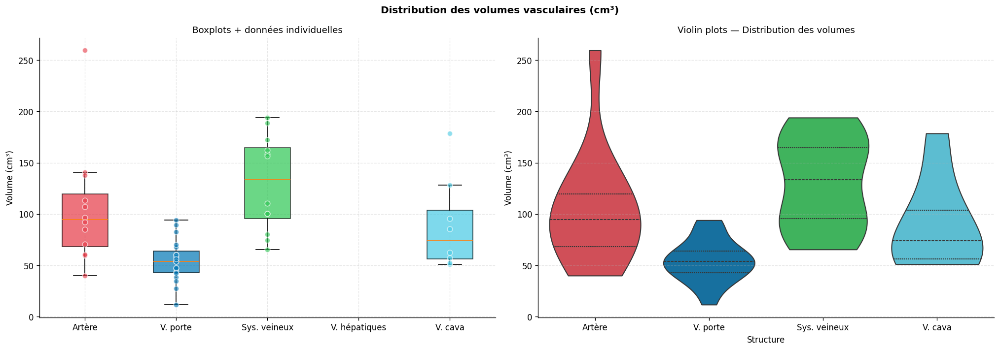

In [ ]:
# ── Boxplots comparatifs + swarmplot ──────────────────────────────────────────
vol_small = ['artery_cm3','portal_cm3','venous_cm3','hepatic_cm3','venacava_cm3']
labels    = ['Artère','V. porte','Sys. veineux','V. hépatiques','V. cava']
colors_bx = [VESSEL_COLORS[k] for k in VASCULAR_TYPES]

fig, axes = plt.subplots(1, 2, figsize=(17, 6))
fig.suptitle('Distribution des volumes vasculaires (cm³)', fontsize=12, fontweight='bold')

# Boxplot
ax = axes[0]
data_bx = [df_stats[c].replace(0, np.nan).dropna().values for c in vol_small]
bp = ax.boxplot(data_bx, labels=labels, patch_artist=True, notch=False,
                showfliers=False)
for patch, color in zip(bp['boxes'], colors_bx):
    patch.set_facecolor(color); patch.set_alpha(0.7)
for i, (data, color) in enumerate(zip(data_bx, colors_bx), 1):
    ax.scatter([i]*len(data), data, alpha=0.6, color=color, s=40,
               edgecolors='white', zorder=5)
ax.set_ylabel('Volume (cm³)'); ax.set_title('Boxplots + données individuelles')

# Violin plot
ax = axes[1]
long_data = []
for col, lbl in zip(vol_small, labels):
    for v in df_stats[col].replace(0, np.nan).dropna().values:
        long_data.append({'Structure': lbl, 'Volume (cm³)': v})
df_long = pd.DataFrame(long_data)
sns.violinplot(data=df_long, x='Structure', y='Volume (cm³)', ax=ax,
               palette=dict(zip(labels, colors_bx)), inner='quartile', cut=0)
ax.set_title('Violin plots — Distribution des volumes')

plt.tight_layout()
plt.savefig('fig_04b_boxplots_violin.png', bbox_inches='tight', dpi=130)
plt.show()


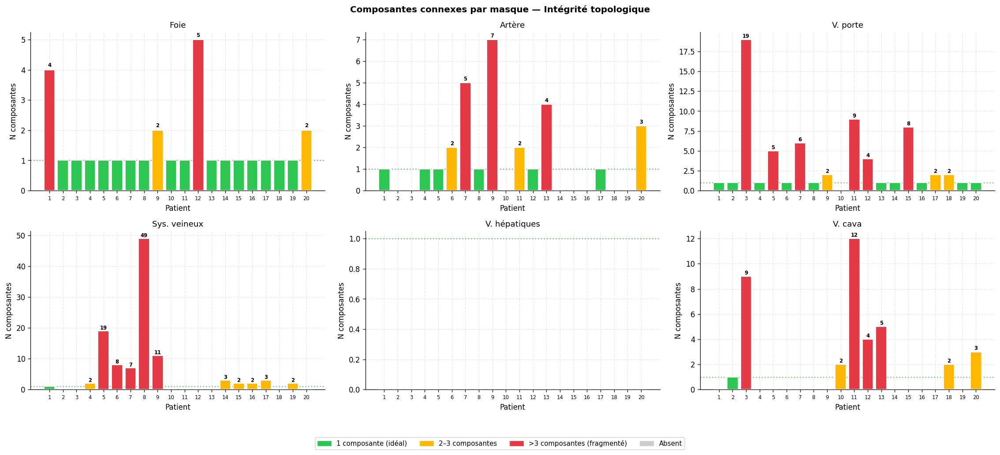

In [ ]:
# ── Composantes connexes (intégrité topologique) ─────────────────────────────
comp_info = [
    ('foie_composantes', 'Foie',            LIVER_COLOR),
    ('artery_comp',      'Artère',           VESSEL_COLORS['artery']),
    ('portal_comp',      'V. porte',         VESSEL_COLORS['portalvein']),
    ('venous_comp',      'Sys. veineux',     VESSEL_COLORS['venous']),
    ('hepatic_comp',     'V. hépatiques',    VESSEL_COLORS['hepaticveins']),
    ('venacava_comp',    'V. cava',          VESSEL_COLORS['venacava']),
]

fig, axes = plt.subplots(2, 3, figsize=(19, 8))
fig.suptitle('Composantes connexes par masque — Intégrité topologique', fontsize=12, fontweight='bold')

for ax, (col, lbl, color) in zip(axes.ravel(), comp_info):
    vals = df_stats[col].fillna(0).astype(int).values
    bar_colors = ['#2DC653' if v == 1 else '#FFB703' if 2 <= v <= 3 else '#E63946' if v > 3 else '#cccccc' for v in vals]
    ax.bar(pids_all, vals, color=bar_colors, edgecolor='white', zorder=3)
    ax.axhline(1, color='green', linestyle=':', alpha=0.5)
    ax.set_title(lbl); ax.set_xlabel('Patient'); ax.set_ylabel('N composantes')
    ax.set_xticks(pids_all); ax.set_xticklabels(pids_all, fontsize=7)
    for p, v in zip(pids_all, vals):
        if v > 1:
            ax.text(p, v+0.05, str(v), ha='center', va='bottom', fontsize=7, fontweight='bold')

fig.legend(handles=[
    mpatches.Patch(color='#2DC653', label='1 composante (idéal)'),
    mpatches.Patch(color='#FFB703', label='2–3 composantes'),
    mpatches.Patch(color='#E63946', label='>3 composantes (fragmenté)'),
    mpatches.Patch(color='#cccccc', label='Absent'),
], loc='lower center', ncol=4, fontsize=9, bbox_to_anchor=(0.5, -0.08))
plt.tight_layout()
plt.savefig('fig_04c_connected_components.png', bbox_inches='tight', dpi=130)
plt.show()


## 4b. Analyse HU intra-vasculaire — Statistiques descriptives complètes

> Les valeurs HU dans les masques vasculaires conditionnent le contraste CT disponible et la difficulté algorithmique de la détection de vaisseaux.


In [ ]:
# ── HU par masque et par patient ─────────────────────────────────────────────
hu_rows = []
for pid in ALL_PIDS:
    entry = patient_data.get(pid, {})
    ct    = entry.get('ct')
    if ct is None: continue
    row = {'patient': pid}
    # Foie
    ml = entry.get('mask_liver')
    if ml is not None and ml.shape == ct.shape and ml.sum() > 0:
        hu_liv = ct[ml.astype(bool)].astype(float)
        row.update({
            'liver_hu_mean':   round(float(np.mean(hu_liv)), 1),
            'liver_hu_median': round(float(np.median(hu_liv)), 1),
            'liver_hu_std':    round(float(np.std(hu_liv)), 1),
            'liver_hu_p5':     round(float(np.percentile(hu_liv, 5)), 1),
            'liver_hu_p95':    round(float(np.percentile(hu_liv, 95)), 1),
        })
    # Vaisseaux
    for vtype in ['artery','portalvein','venous','hepaticveins','venacava']:
        mv = entry.get(f'mask_{vtype}')
        if mv is not None and mv.shape == ct.shape and mv.sum() > 0:
            hu_v = ct[mv.astype(bool)].astype(float)
            row.update({
                f'{vtype}_hu_mean':   round(float(np.mean(hu_v)), 1),
                f'{vtype}_hu_median': round(float(np.median(hu_v)), 1),
                f'{vtype}_hu_std':    round(float(np.std(hu_v)), 1),
                f'{vtype}_hu_p5':     round(float(np.percentile(hu_v, 5)), 1),
                f'{vtype}_hu_p95':    round(float(np.percentile(hu_v, 95)), 1),
                f'{vtype}_hu_iqr':    round(float(np.percentile(hu_v,75)-np.percentile(hu_v,25)), 1),
                f'{vtype}_hu_skew':   round(float(stats.skew(hu_v)), 3),
            })
    hu_rows.append(row)

df_hu = pd.DataFrame(hu_rows).set_index('patient')

# Affichage
hu_mean_cols = [c for c in df_hu.columns if 'mean' in c]
print("Valeurs HU moyennes par structure et patient :")
display(df_hu[hu_mean_cols].style
        .background_gradient(cmap='coolwarm', axis=None)
        .format('{:.1f}', na_rep='—'))


Valeurs HU moyennes par structure et patient :


,liver_hu_mean,artery_hu_mean,portalvein_hu_mean,venous_hu_mean,venacava_hu_mean
patient,,,,,
1,110.6,168.8,168.8,151.5,—
2,96.7,—,132.3,—,124.3
3,104.7,—,138.0,—,132.7
4,105.4,124.6,122.9,102.7,—
5,76.1,121.2,139.0,114.0,—
6,103.7,116.5,125.3,106.3,—
7,120.9,160.7,151.5,119.0,—
8,164.4,147.3,183.7,174.5,—
9,88.7,98.2,139.2,90.5,—


In [ ]:
# ── Stats descriptives HU ─────────────────────────────────────────────────────
hu_desc_cols = {
    'liver'     : 'Foie',
    'artery'    : 'Artère',
    'portalvein': 'V. porte',
    'venous'    : 'Sys. veineux',
    'venacava'  : 'V. cave',
}

print("Statistiques descriptives complètes — Valeurs HU par structure :\n")
for vtype, label in hu_desc_cols.items():
    col = f'{vtype}_hu_mean'
    if col not in df_hu.columns: continue
    s = df_hu[col].dropna()
    if len(s) == 0: continue
    print(f"  ── {label} ({'N='+str(len(s))}) ──")
    print(f"    Moyenne   : {s.mean():.1f} HU")
    print(f"    Médiane   : {s.median():.1f} HU")
    print(f"    Écart-type: {s.std():.1f} HU")
    print(f"    IQR       : {s.quantile(0.75)-s.quantile(0.25):.1f} HU")
    print(f"    Min/Max   : {s.min():.1f} / {s.max():.1f} HU")
    print(f"    P5 / P95  : {s.quantile(0.05):.1f} / {s.quantile(0.95):.1f} HU")
    print(f"    Skewness  : {stats.skew(s):.3f}")
    print(f"    Kurtosis  : {stats.kurtosis(s):.3f}")
    print()


Statistiques descriptives complètes — Valeurs HU par structure :

  ── Foie (N=20) ──
    Moyenne   : 101.3 HU
    Médiane   : 104.2 HU
    Écart-type: 28.1 HU
    IQR       : 17.3 HU
    Min/Max   : 28.7 / 164.4 HU
    P5 / P95  : 50.2 / 134.2 HU
    Skewness  : -0.560
    Kurtosis  : 1.600

  ── Artère (N=12) ──
    Moyenne   : 131.4 HU
    Médiane   : 131.3 HU
    Écart-type: 22.7 HU
    IQR       : 33.2 HU
    Min/Max   : 98.2 / 168.8 HU
    P5 / P95  : 101.9 / 164.3 HU
    Skewness  : 0.118
    Kurtosis  : -1.151

  ── V. porte (N=19) ──
    Moyenne   : 145.7 HU
    Médiane   : 139.2 HU
    Écart-type: 22.8 HU
    IQR       : 22.8 HU
    Min/Max   : 102.9 / 199.1 HU
    P5 / P95  : 120.9 / 185.2 HU
    Skewness  : 0.563
    Kurtosis  : 0.215

  ── Sys. veineux (N=12) ──
    Moyenne   : 131.5 HU
    Médiane   : 130.2 HU
    Écart-type: 30.0 HU
    IQR       : 46.3 HU
    Min/Max   : 90.5 / 181.2 HU
    P5 / P95  : 96.6 / 177.5 HU
    Skewness  : 0.275
    Kurtosis  : -1.197

  ── V

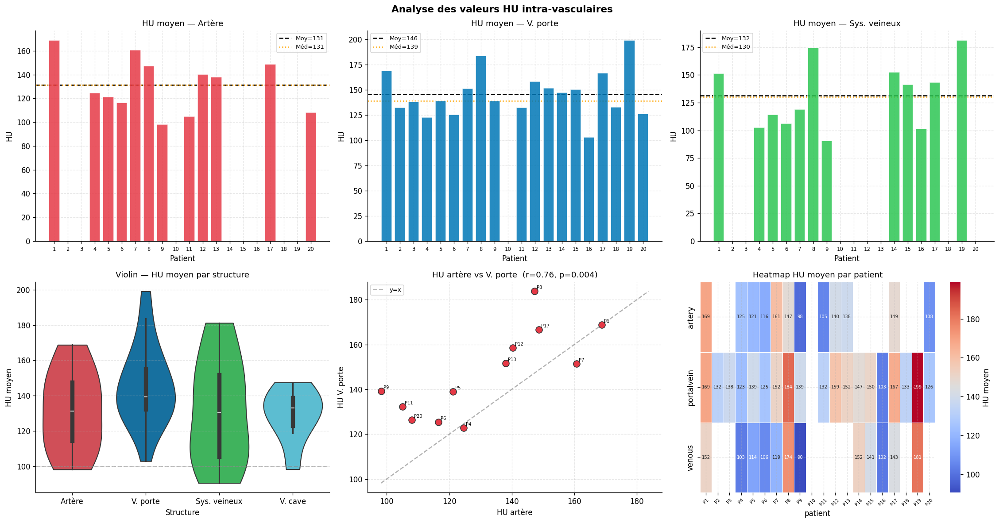

In [ ]:
# ── Figure HU multi-panels ────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(19, 10))
fig.suptitle('Analyse des valeurs HU intra-vasculaires', fontsize=13, fontweight='bold')

vtype_info = [
    ('artery',     'Artère',        VESSEL_COLORS['artery']),
    ('portalvein', 'V. porte',      VESSEL_COLORS['portalvein']),
    ('venous',     'Sys. veineux',  VESSEL_COLORS['venous']),
    ('venacava',  'V. cave',       VESSEL_COLORS['venacava']),
]

# 1–3. HU moyen par patient par type
for ax, (vtype, label, color) in zip(axes[0], vtype_info):
    col = f'{vtype}_hu_mean'
    if col not in df_hu.columns:
        ax.text(0.5, 0.5, 'Données insuffisantes', ha='center', va='center',
                transform=ax.transAxes); continue
    vals = df_hu[col].values
    bar_colors = [color if not np.isnan(v) else '#cccccc' for v in vals]
    ax.bar(pids_all, np.nan_to_num(vals), color=bar_colors, edgecolor='white', alpha=0.85, zorder=3)
    valid = vals[~np.isnan(vals)]
    if len(valid) > 0:
        ax.axhline(np.mean(valid),   color='black',  linestyle='--', lw=1.5, label=f'Moy={np.mean(valid):.0f}')
        ax.axhline(np.median(valid), color='orange', linestyle=':',  lw=1.5, label=f'Méd={np.median(valid):.0f}')
    ax.set_title(f'HU moyen — {label}')
    ax.set_xlabel('Patient'); ax.set_ylabel('HU')
    ax.set_xticks(pids_all); ax.set_xticklabels(pids_all, fontsize=7)
    ax.legend(fontsize=8)

# 4. Violin HU tous vaisseaux
ax = axes[1, 0]
hu_long = []
for vtype, label, color in vtype_info:
    col = f'{vtype}_hu_mean'
    if col not in df_hu.columns: continue
    for v in df_hu[col].dropna().values:
        hu_long.append({'Structure': label, 'HU moyen': v})
df_hu_long = pd.DataFrame(hu_long)
if len(df_hu_long) > 0:
    sns.violinplot(data=df_hu_long, x='Structure', y='HU moyen', ax=ax,
                   palette=[c for _,_,c in vtype_info], inner='box', cut=0)
    ax.axhline(100, color='gray', linestyle='--', alpha=0.5)
ax.set_title('Violin — HU moyen par structure')

# 5. Scatter artère vs veine porte
ax = axes[1, 1]
a_col  = 'artery_hu_mean'
pv_col = 'portalvein_hu_mean'
if a_col in df_hu.columns and pv_col in df_hu.columns:
    mask_both = df_hu[[a_col, pv_col]].dropna()
    ax.scatter(mask_both[a_col], mask_both[pv_col],
               c=VESSEL_COLORS['artery'], s=80, edgecolors='#333', zorder=3)
    for pid in mask_both.index:
        ax.annotate(f'P{pid}', (mask_both.loc[pid, a_col], mask_both.loc[pid, pv_col]),
                    fontsize=6, xytext=(3, 3), textcoords='offset points')
    lims = [min(mask_both.min()), max(mask_both.max())]
    ax.plot(lims, lims, 'k--', alpha=0.3, label='y=x')
    # Corrélation
    r, p = stats.pearsonr(mask_both[a_col], mask_both[pv_col])
    ax.set_title(f'HU artère vs V. porte  (r={r:.2f}, p={p:.3f})')
    ax.legend(fontsize=8)
ax.set_xlabel('HU artère'); ax.set_ylabel('HU V. porte')

# 6. Heatmap HU moyens
ax = axes[1, 2]
hu_heatmap_cols = [f'{vt}_hu_mean' for vt in ['artery','portalvein','venous']]
hu_heatmap_cols = [c for c in hu_heatmap_cols if c in df_hu.columns]
if hu_heatmap_cols:
    data_hm = df_hu[hu_heatmap_cols].T
    data_hm.index = [c.replace('_hu_mean','') for c in hu_heatmap_cols]
    sns.heatmap(data_hm, ax=ax, cmap='coolwarm', annot=True, fmt='.0f',
                linewidths=0.3, cbar_kws={'label':'HU moyen'}, annot_kws={'size':6})
    ax.set_title('Heatmap HU moyen par patient')
    ax.set_xticklabels([f'P{p}' for p in pids_all], fontsize=6, rotation=45)

plt.tight_layout()
plt.savefig('fig_04d_hu_analysis.png', bbox_inches='tight', dpi=130)
plt.show()


## 4c. Analyses croisées — Corrélations, profils démographiques

> Exploration des relations entre paramètres géométriques, volumes, valeurs HU et caractéristiques patients.


In [ ]:
# ── Assemblage du tableau consolidé pour analyses croisées ───────────────────
cross_rows = []
for pid in ALL_PIDS:
    meta  = IRCAD_META[pid]
    entry = patient_data.get(pid, {})
    infos = entry.get('infos')
    sp    = infos['spacing_xyz'] if infos else (meta['vx'], meta['vx'], meta['vz'])
    sx, sy, sz = sp
    ratio_z_xy = sz / ((sx+sy)/2)
    cross_rows.append({
        'patient'       : pid,
        'sex'           : meta['sex'],
        'age'           : 2010 - meta['birth'], # année de scan ~2010 (approximation)
        'n_tumors'      : meta['n_tumors'],
        'sz_mm'         : sz,
        'ratio_z_xy'    : ratio_z_xy,
        'foie_cm3'      : df_stats.loc[pid, 'foie_cm3'] if pid in df_stats.index else np.nan,
        'artery_cm3'    : df_stats.loc[pid, 'artery_cm3'] if pid in df_stats.index else 0,
        'portal_cm3'    : df_stats.loc[pid, 'portal_cm3'] if pid in df_stats.index else 0,
        'venous_cm3'    : df_stats.loc[pid, 'venous_cm3'] if pid in df_stats.index else 0,
        'venacava_cm3'   : df_stats.loc[pid, 'venacava_cm3'] if pid in df_stats.index else 0,
        'n_vx'          : df_stats.loc[pid, 'n_vx_present'] if pid in df_stats.index else 0,
        'artery_hu_mean': df_hu.loc[pid, 'artery_hu_mean'] if pid in df_hu.index and 'artery_hu_mean' in df_hu.columns else np.nan,
        'portal_hu_mean': df_hu.loc[pid, 'portalvein_hu_mean'] if pid in df_hu.index and 'portalvein_hu_mean' in df_hu.columns else np.nan,
        'liver_hu_mean' : df_hu.loc[pid, 'liver_hu_mean'] if pid in df_hu.index and 'liver_hu_mean' in df_hu.columns else np.nan,
        'venacava_hu_mean': df_hu.loc[pid, 'venacava_hu_mean'] if pid in df_hu.index and 'venacava_hu_mean' in df_hu.columns else np.nan
    })

df_cross = pd.DataFrame(cross_rows).set_index('patient')
df_cross['sex_bin'] = (df_cross['sex'] == 'F').astype(int)

print("Tableau consolidé pour analyses croisées :")
display(df_cross.style.format({c: '{:.2f}' for c in df_cross.select_dtypes(float).columns}, na_rep='—'))


Tableau consolidé pour analyses croisées :


,sex,age,n_tumors,sz_mm,ratio_z_xy,foie_cm3,artery_cm3,portal_cm3,venous_cm3,venacava_cm3,n_vx,artery_hu_mean,portal_hu_mean,liver_hu_mean,venacava_hu_mean,sex_bin
patient,,,,,,,,,,,,,,,,
1,F,66,7,1.60,2.81,1489.41,59.74,53.82,74.43,0.00,3,168.80,168.80,110.60,—,1
2,F,23,1,1.60,2.05,1612.49,0.00,11.75,0.00,51.17,2,—,132.30,96.70,124.30,1
3,M,54,1,1.25,2.00,1159.71,0.00,38.72,0.00,52.59,2,—,138.00,104.70,132.70,0
4,M,68,7,2.00,2.69,1247.58,70.74,82.88,158.66,0.00,3,124.60,122.90,105.40,—,0
5,M,53,0,1.60,2.05,2078.70,113.21,60.44,100.48,0.00,3,121.20,139.00,76.10,—,0
6,M,81,20,1.60,2.05,1789.07,140.66,94.01,156.64,0.00,3,116.50,125.30,103.70,—,0
7,M,64,0,1.60,2.05,1430.42,96.50,58.24,162.21,0.00,3,160.70,151.50,120.90,—,0
8,F,40,3,1.60,2.85,1618.97,60.56,27.27,193.96,0.00,3,147.30,183.70,164.40,—,1
9,M,61,1,2.00,2.29,1929.03,259.47,89.51,188.77,0.00,3,98.20,139.20,88.70,—,0


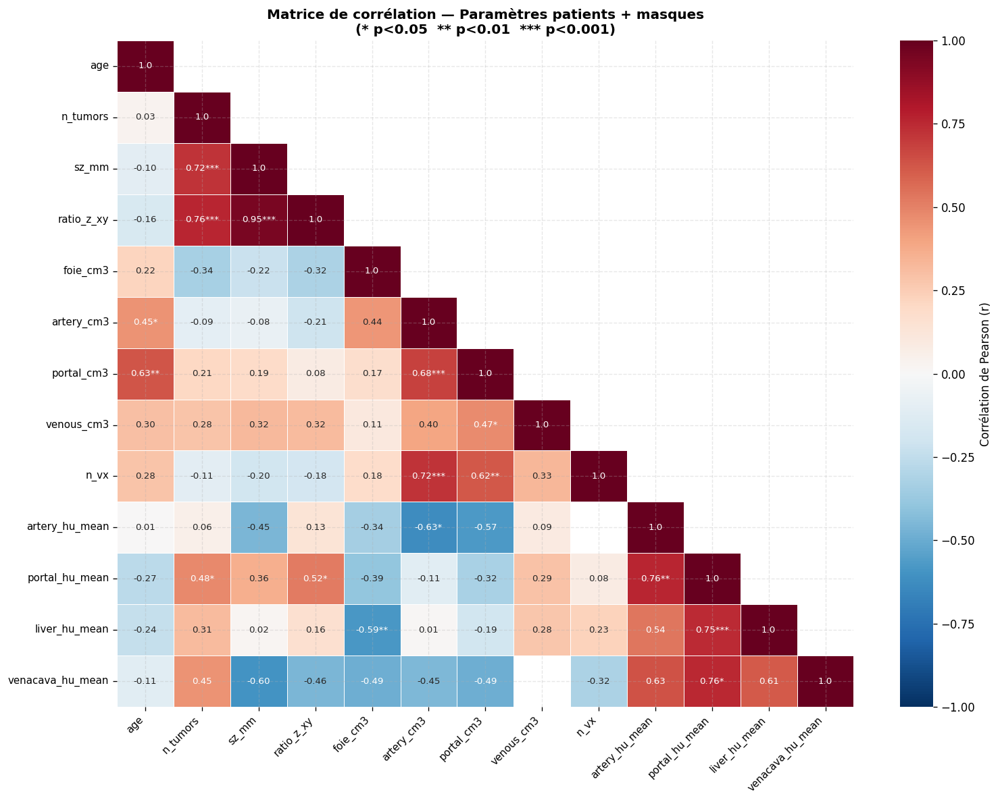


Correlations significatives (|r|>0.4, p<0.05) :
  age                  ↔ artery_cm3            r=0.446  p=0.0490
  age                  ↔ portal_cm3            r=0.626  p=0.0031
  n_tumors             ↔ sz_mm                 r=0.720  p=0.0003
  n_tumors             ↔ ratio_z_xy            r=0.760  p=0.0001
  n_tumors             ↔ portal_hu_mean        r=0.481  p=0.0371
  sz_mm                ↔ ratio_z_xy            r=0.950  p=0.0000
  ratio_z_xy           ↔ portal_hu_mean        r=0.516  p=0.0238
  foie_cm3             ↔ liver_hu_mean         r=-0.586  p=0.0067
  artery_cm3           ↔ portal_cm3            r=0.681  p=0.0009
  artery_cm3           ↔ n_vx                  r=0.721  p=0.0003
  artery_cm3           ↔ artery_hu_mean        r=-0.630  p=0.0281
  portal_cm3           ↔ venous_cm3            r=0.474  p=0.0347
  portal_cm3           ↔ n_vx                  r=0.621  p=0.0035
  artery_hu_mean       ↔ portal_hu_mean        r=0.760  p=0.0042
  portal_hu_mean       ↔ liver_hu_mean 

In [ ]:
# ── Matrice de corrélation complète ──────────────────────────────────────────
num_cols = ['age','n_tumors','sz_mm','ratio_z_xy','foie_cm3',
            'artery_cm3','portal_cm3','venous_cm3','n_vx',
            'artery_hu_mean','portal_hu_mean','liver_hu_mean', 'venacava_hu_mean']
num_cols = [c for c in num_cols if c in df_cross.columns]

corr_mat  = df_cross[num_cols].corr()
pval_mat  = pd.DataFrame(np.zeros_like(corr_mat.values), index=corr_mat.index, columns=corr_mat.columns)
for i, ci in enumerate(num_cols):
    for j, cj in enumerate(num_cols):
        if i != j:
            mask = df_cross[[ci, cj]].dropna()
            if len(mask) >= 3:
                _, p = stats.pearsonr(mask[ci], mask[cj])
                pval_mat.loc[ci, cj] = p

fig, ax = plt.subplots(figsize=(13, 10))
mask_upper = np.triu(np.ones_like(corr_mat, dtype=bool), k=1)
annot_str  = corr_mat.round(2).astype(str)
# Ajouter astérisques significativité
for i, ci in enumerate(num_cols):
    for j, cj in enumerate(num_cols):
        p = pval_mat.loc[ci, cj]
        sig = '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else ''
        if i != j and not mask_upper[i, j]:
            annot_str.loc[ci, cj] = f"{corr_mat.loc[ci, cj]:.2f}{sig}"

sns.heatmap(corr_mat, ax=ax, cmap='RdBu_r', center=0, vmin=-1, vmax=1,
            annot=annot_str, fmt='', linewidths=0.5, linecolor='white',
            mask=mask_upper, cbar_kws={'label': 'Corrélation de Pearson (r)'},
            annot_kws={'size': 8})
ax.set_title('Matrice de corrélation — Paramètres patients + masques\n(* p<0.05  ** p<0.01  *** p<0.001)',
             fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.savefig('fig_04e_correlation_matrix.png', bbox_inches='tight', dpi=130)
plt.show()

# Corrélations les plus fortes
print("\nCorrelations significatives (|r|>0.4, p<0.05) :")
for i, ci in enumerate(num_cols):
    for j, cj in enumerate(num_cols):
        if i >= j: continue
        r = corr_mat.loc[ci, cj]; p = pval_mat.loc[ci, cj]
        if abs(r) > 0.4 and p < 0.05:
            print(f"  {ci:<20} ↔ {cj:<20}  r={r:.3f}  p={p:.4f}")


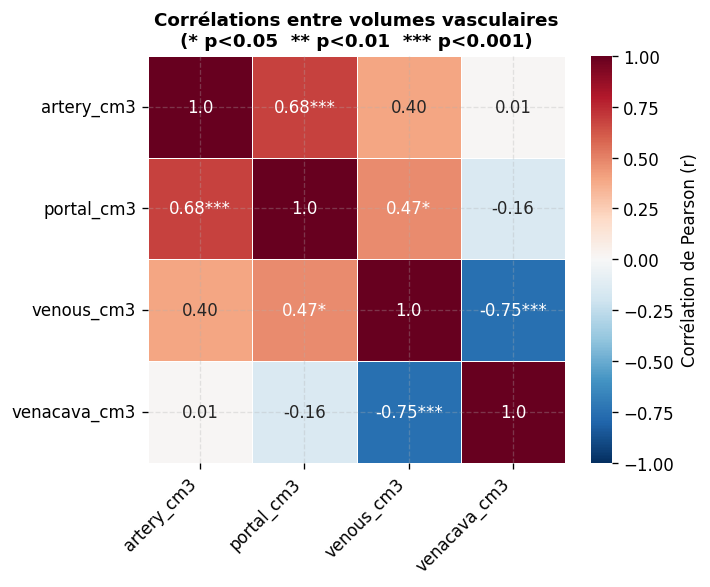


Corrélations entre volumes vasculaires :
  artery_cm3      ↔ portal_cm3       r = 0.681  p = 0.0009 ***
  artery_cm3      ↔ venous_cm3       r = 0.396  p = 0.0835 ns
  artery_cm3      ↔ venacava_cm3     r = 0.013  p = 0.9550 ns
  portal_cm3      ↔ venous_cm3       r = 0.474  p = 0.0347 *
  portal_cm3      ↔ venacava_cm3     r = -0.155  p = 0.5132 ns
  venous_cm3      ↔ venacava_cm3     r = -0.751  p = 0.0001 ***


In [ ]:
# ── Matrice de corrélation entre volumes vasculaires ──────────────────────────
vasc_cols = ['artery_cm3', 'portal_cm3', 'venous_cm3']

# Ajouter la veine cave si présente et pertinente
if 'venacava_cm3' in df_cross.columns:
    vasc_cols.append('venacava_cm3')
# Sinon, si seule la densité HU est dispo, commenter ou ignorer

# Garder uniquement les colonnes existantes
vasc_cols = [c for c in vasc_cols if c in df_cross.columns]

corr_mat = df_cross[vasc_cols].corr()
pval_mat = pd.DataFrame(np.zeros_like(corr_mat.values), index=corr_mat.columns, columns=corr_mat.columns)

for i, ci in enumerate(vasc_cols):
    for j, cj in enumerate(vasc_cols):
        if i != j:
            mask = df_cross[[ci, cj]].dropna()
            if len(mask) >= 3:
                _, p = stats.pearsonr(mask[ci], mask[cj])
                pval_mat.loc[ci, cj] = p

# Affichage
fig, ax = plt.subplots(figsize=(6, 5))

# Annotations avec astérisques
annot_str = corr_mat.round(2).astype(str)
for i, ci in enumerate(vasc_cols):
    for j, cj in enumerate(vasc_cols):
        p = pval_mat.loc[ci, cj]
        sig = '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else ''
        if i != j:
            annot_str.loc[ci, cj] = f"{corr_mat.loc[ci, cj]:.2f}{sig}"

sns.heatmap(corr_mat, ax=ax, cmap='RdBu_r', center=0, vmin=-1, vmax=1,
            annot=annot_str, fmt='', linewidths=0.5, linecolor='white',
            cbar_kws={'label': 'Corrélation de Pearson (r)'},
            annot_kws={'size': 10})
ax.set_title('Corrélations entre volumes vasculaires\n(* p<0.05  ** p<0.01  *** p<0.001)',
             fontsize=11, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('fig_corr_vaisseaux.png', bbox_inches='tight', dpi=130)
plt.show()

# Affichage textuel
print("\nCorrélations entre volumes vasculaires :")
for i, ci in enumerate(vasc_cols):
    for j, cj in enumerate(vasc_cols):
        if i < j:
            r = corr_mat.loc[ci, cj]
            p = pval_mat.loc[ci, cj]
            sig = '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else 'ns'
            print(f"  {ci:<15} ↔ {cj:<15}  r = {r:.3f}  p = {p:.4f} {sig}")

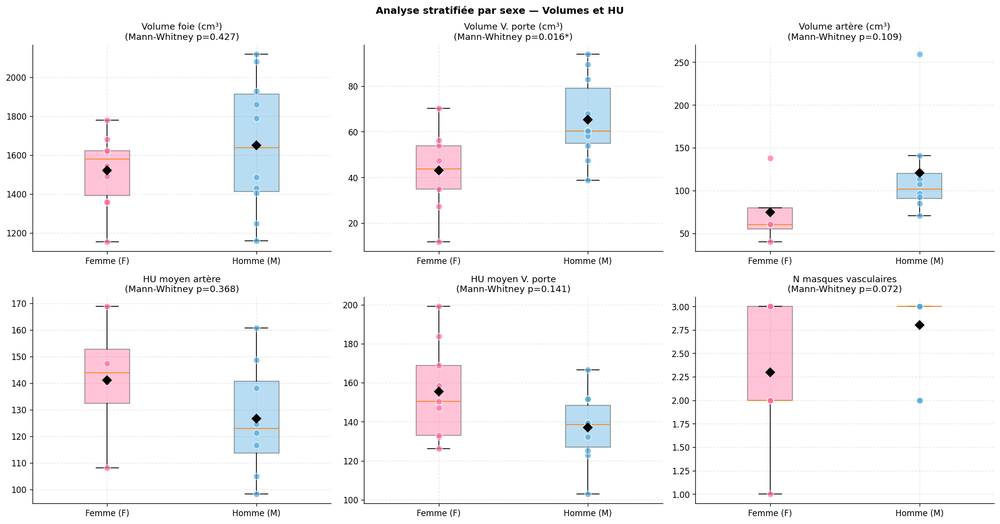

In [ ]:
# ── Analyse par sexe ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(17, 9))
fig.suptitle('Analyse stratifiée par sexe — Volumes et HU', fontsize=12, fontweight='bold')

sex_palette = {'F': '#FF6B9D', 'M': '#4EA8DE'}
compare_cols = [
    ('foie_cm3',       'Volume foie (cm³)'),
    ('portal_cm3',     'Volume V. porte (cm³)'),
    ('artery_cm3',     'Volume artère (cm³)'),
    ('artery_hu_mean', 'HU moyen artère'),
    ('portal_hu_mean', 'HU moyen V. porte'),
    ('n_vx',           'N masques vasculaires'),
]
for ax, (col, label) in zip(axes.ravel(), compare_cols):
    for sex, color in sex_palette.items():
        vals = df_cross[df_cross['sex']==sex][col].replace(0, np.nan).dropna().values
        if len(vals) == 0: continue
        ax.scatter([sex]*len(vals), vals, color=color, s=60, alpha=0.7,
                   edgecolors='white', zorder=3)
        ax.plot([sex], [np.mean(vals)], 'D', color='black', ms=8, zorder=5,
                label=f'{sex}: Moy={np.mean(vals):.2f}')
        # Boxplot
        bp = ax.boxplot([vals], positions=[{'F':0,'M':1}[sex]], widths=0.3,
                        patch_artist=True, showfliers=False)
        bp['boxes'][0].set(facecolor=color, alpha=0.4)
    # Test Mann-Whitney
    v_f = df_cross[df_cross['sex']=='F'][col].replace(0,np.nan).dropna().values
    v_m = df_cross[df_cross['sex']=='M'][col].replace(0,np.nan).dropna().values
    if len(v_f) >= 2 and len(v_m) >= 2:
        _, p = stats.mannwhitneyu(v_f, v_m, alternative='two-sided')
        ax.set_title(f'{label}\n(Mann-Whitney p={p:.3f}{"*" if p<0.05 else ""})')
    else:
        ax.set_title(label)
    ax.set_xticks([0, 1]); ax.set_xticklabels(['Femme (F)', 'Homme (M)'])

plt.tight_layout()
plt.savefig('fig_04f_sex_stratified.png', bbox_inches='tight', dpi=130)
plt.show()


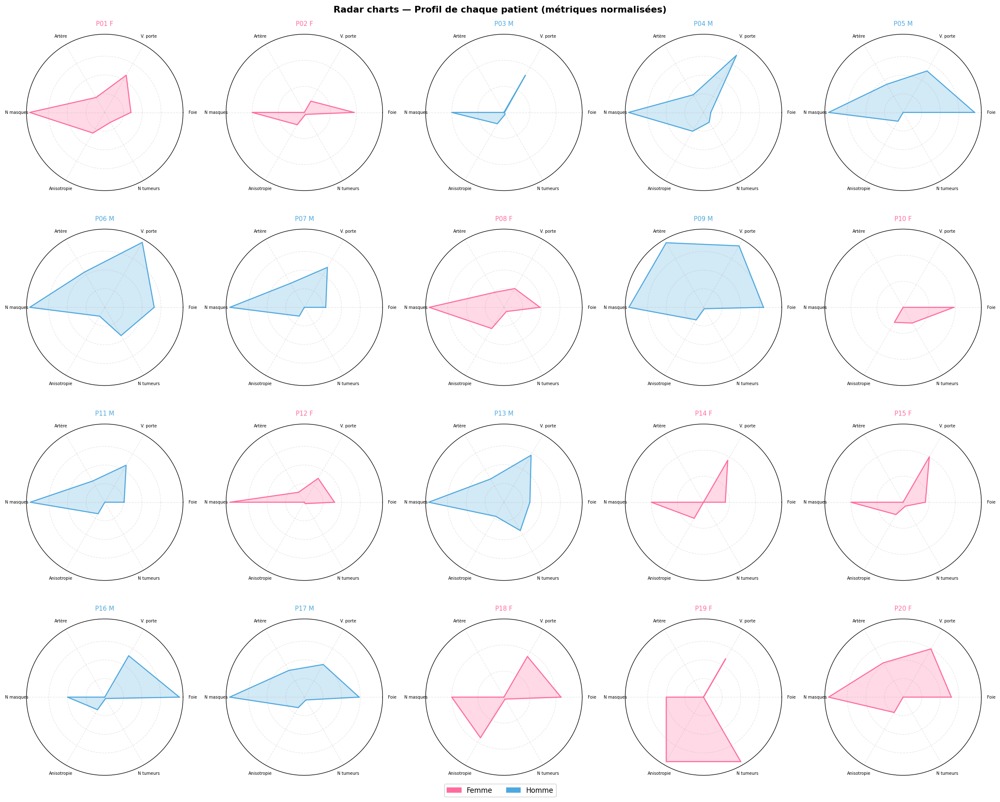

In [ ]:
# ── Radar chart — profil moyen par patient ───────────────────────────────────
# Normalise les métriques clés sur [0,1] pour le radar
radar_cols = ['foie_cm3','portal_cm3','artery_cm3','n_vx','ratio_z_xy','n_tumors']
radar_labs  = ['Foie', 'V. porte', 'Artère', 'N masques', 'Anisotropie', 'N tumeurs']

df_radar = df_cross[radar_cols].copy()
df_radar_norm = (df_radar - df_radar.min()) / (df_radar.max() - df_radar.min() + 1e-9)

N = len(radar_cols)
angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
angles += angles[:1]

fig, axes = plt.subplots(4, 5, figsize=(20, 16), subplot_kw=dict(polar=True))
fig.suptitle('Radar charts — Profil de chaque patient (métriques normalisées)',
             fontsize=13, fontweight='bold')

for ax, pid in zip(axes.ravel(), ALL_PIDS):
    vals = df_radar_norm.loc[pid].tolist() + [df_radar_norm.loc[pid].tolist()[0]]
    meta = IRCAD_META[pid]
    color = '#FF6B9D' if meta['sex'] == 'F' else '#4EA8DE'
    ax.plot(angles, vals, color=color, linewidth=1.5, linestyle='solid')
    ax.fill(angles, vals, color=color, alpha=0.25)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(radar_labs, size=6)
    ax.set_yticks([0.25, 0.5, 0.75])
    ax.set_yticklabels(['', '', ''], size=0)
    ax.set_title(f'P{pid:02d} {meta["sex"]}', size=9, pad=12, color=color)
    ax.grid(True, alpha=0.3)

fig.legend(handles=[
    mpatches.Patch(color='#FF6B9D', label='Femme'),
    mpatches.Patch(color='#4EA8DE', label='Homme'),
], loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, -0.01))
plt.tight_layout()
plt.savefig('fig_04g_radar_charts.png', bbox_inches='tight', dpi=110)
plt.show()


## 5. Détection automatique d'anomalies

In [ ]:
# ── Fonctions d'anomalie ─────────────────────────────────────────────────────
def pct_vessel_outside_liver(mask_vessel, mask_liver, pid=0, vtype='') -> float:
    if mask_vessel is None or mask_vessel.sum() == 0: return np.nan
    if mask_liver  is None or mask_liver.sum()  == 0: return np.nan
    if mask_vessel.shape != mask_liver.shape:
        print(f"  ⚠ P{pid:02d} {vtype}: shape mismatch → NaN")
        return np.nan
    outside = int(np.logical_and(mask_vessel, ~mask_liver.astype(bool)).sum())
    return round(100 * outside / int(mask_vessel.sum()), 2)

def ratio_vessel_liver(vol_vessel_cm3, vol_liver_cm3) -> float:
    if vol_liver_cm3 == 0 or np.isnan(vol_liver_cm3): return np.nan
    return round(100 * vol_vessel_cm3 / vol_liver_cm3, 3)

anomaly_rows = []
for pid in ALL_PIDS:
    entry     = patient_data.get(pid, {})
    meta      = IRCAD_META[pid]
    ml        = entry.get('mask_liver')
    vol_liver = df_stats.loc[pid, 'foie_cm3'] if pid in df_stats.index else 0
    row       = {'patient': pid, 'n_slices_ircad': meta['slices']}

    infos = entry.get('infos')
    if infos:
        row['n_slices_dicom'] = infos['n_slices']
        row['slices_match']   = infos['n_slices'] == meta['slices']
    else:
        row['n_slices_dicom'] = np.nan; row['slices_match'] = None

    fusion_mask = None
    for vtype in VASCULAR_TYPES:
        mv     = entry.get(f'mask_{vtype}')
        col_nm = {'artery':'artery_cm3','portalvein':'portal_cm3',
                  'venous':'venous_cm3','hepaticveins':'hepatic_cm3','venacava':'venacava_cm3'}.get(vtype)
        vol_v  = df_stats.loc[pid, col_nm] if pid in df_stats.index and col_nm else 0
        row[f'{vtype}_pct_hors_foie']    = pct_vessel_outside_liver(mv, ml, pid, vtype)
        row[f'{vtype}_ratio_v_foie_pct'] = ratio_vessel_liver(vol_v, vol_liver)
        if mv is not None:
            fusion_mask = mv if fusion_mask is None else np.logical_or(fusion_mask, mv).astype(np.uint8)

    vol_fus = df_stats.loc[pid, 'fusion_cm3'] if pid in df_stats.index else 0
    row['fusion_pct_hors_foie']    = pct_vessel_outside_liver(fusion_mask, ml, pid, 'fusion')
    row['fusion_ratio_v_foie_pct'] = ratio_vessel_liver(vol_fus, vol_liver)
    anomaly_rows.append(row)

df_anomaly = pd.DataFrame(anomaly_rows).set_index('patient')
print("Tableau d'anomalies créé.")
print(f"N patients avec fusion>10% hors foie : {(df_anomaly['fusion_pct_hors_foie']>10).sum()}")


Tableau d'anomalies créé.
N patients avec fusion>10% hors foie : 20


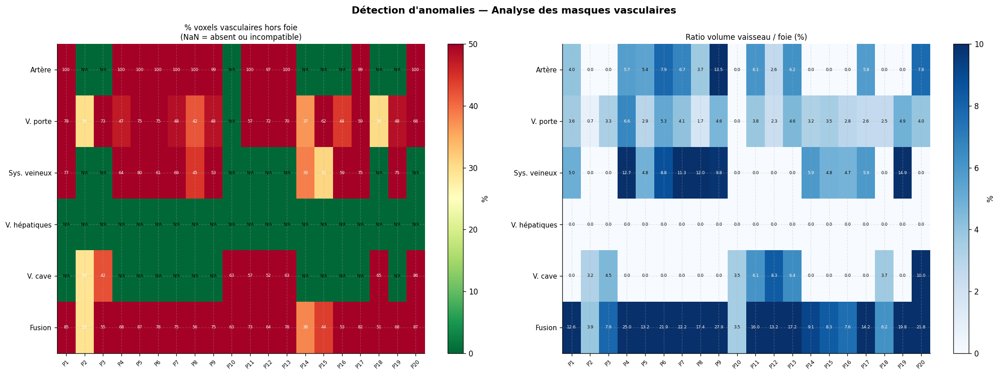

Cohérence nb coupes (DICOM vs table IRCAD) :
Patient  IRCAD    DICOM    Match
  P01   129      129      ✓
  P02   172      172      ✓
  P03   200      200      ✓
  P04   91       91       ✓
  P05   139      139      ✓
  P06   135      135      ✓
  P07   151      151      ✓
  P08   124      124      ✓
  P09   111      111      ✓
  P10   122      122      ✓
  P11   132      132      ✓
  P12   260      260      ✓
  P13   122      122      ✓
  P14   113      113      ✓
  P15   125      125      ✓
  P16   155      155      ✓
  P17   119      119      ✓
  P18   74       74       ✓
  P19   124      124      ✓
  P20   225      225      ✓


In [ ]:
# ── Heatmaps anomalies enrichies ─────────────────────────────────────────────
hf_cols     = [f'{vt}_pct_hors_foie' for vt in VASCULAR_TYPES] + ['fusion_pct_hors_foie']
ratio_cols  = [f'{vt}_ratio_v_foie_pct' for vt in VASCULAR_TYPES] + ['fusion_ratio_v_foie_pct']
labels_vt   = ['Artère','V. porte','Sys. veineux','V. hépatiques','V. cave','Fusion']

fig, axes = plt.subplots(1, 2, figsize=(19, 7))
fig.suptitle('Détection d\'anomalies — Analyse des masques vasculaires', fontsize=13, fontweight='bold')

for ax, cols, title, cmap, vmax, fmt in [
    (axes[0], hf_cols,    '% voxels vasculaires hors foie\n(NaN = absent ou incompatible)',
     'RdYlGn_r', 50, '{:.0f}'),
    (axes[1], ratio_cols, 'Ratio volume vaisseau / foie (%)',
     'Blues', 10, '{:.1f}'),
]:
    df_plot = pd.DataFrame()
    for col, lbl in zip(cols, labels_vt):
        if col in df_anomaly.columns:
            df_plot[lbl] = df_anomaly[col]
    if df_plot.empty: continue
    data = df_plot.T.fillna(-1)
    im   = ax.imshow(data.values, cmap=cmap, vmin=0, vmax=vmax, aspect='auto')
    ax.set_xticks(range(20)); ax.set_xticklabels([f'P{p}' for p in ALL_PIDS], fontsize=7, rotation=45)
    ax.set_yticks(range(len(df_plot.columns))); ax.set_yticklabels(df_plot.columns, fontsize=9)
    ax.set_title(title, fontsize=10)
    plt.colorbar(im, ax=ax, label='%')
    for i in range(len(df_plot.columns)):
        for j in range(20):
            v   = data.iloc[i, j]
            txt = 'N/A' if v < 0 else fmt.format(v)
            ax.text(j, i, txt, ha='center', va='center', fontsize=5.5,
                    color='white' if v > vmax*0.55 else 'black')

plt.tight_layout()
plt.savefig('fig_05_anomaly_heatmaps.png', bbox_inches='tight', dpi=130)
plt.show()

# Vérification cohérence coupes
print("Cohérence nb coupes (DICOM vs table IRCAD) :")
print(f"{'Patient':<8} {'IRCAD':<8} {'DICOM':<8} {'Match'}")
for pid in ALL_PIDS:
    row   = df_anomaly.loc[pid]
    match = row.get('slices_match')
    dicom = row.get('n_slices_dicom')
    icon  = '✓' if match else ('✗' if match is False else '?')
    print(f"  P{pid:02d}   {int(row['n_slices_ircad']):<8} {str(int(dicom)) if not np.isnan(dicom) else 'N/A':<8} {icon}")


## 6. Tableau de synthèse — Score de confiance

In [ ]:
# ── Score de confiance ────────────────────────────────────────────────────────
def compute_confidence_score(pid: int) -> Tuple[int, str, list]:
    entry  = patient_data.get(pid, {})
    score  = 0; notes = []
    if entry.get('ct') is None:
        return 0, 'EXCLURE', ['CT manquant']
    score += 1
    ml           = entry.get('mask_liver')
    n_comp_liver = df_stats.loc[pid, 'foie_composantes'] if pid in df_stats.index else 0
    compat_liv   = entry.get('compat_liver', (None,''))
    if ml is not None and n_comp_liver == 1 and compat_liv[0] is not False:
        score += 1
    elif ml is not None:
        if compat_liv[0] is False: notes.append(f'Foie incompatible ({compat_liv[1]})')
        elif n_comp_liver > 1: notes.append(f'Foie fragmenté ({int(n_comp_liver)} comp.)')
    else:
        notes.append('Foie absent')
    vx_core = ['artery','portalvein','venous']
    n_vx    = sum(1 for vt in vx_core if entry.get(f'mask_{vt}') is not None)
    if n_vx >= 2: score += 1
    else: notes.append(f'{n_vx}/3 masques vx')
    pct_out = df_anomaly.loc[pid, 'fusion_pct_hors_foie'] if pid in df_anomaly.index else np.nan
    if not np.isnan(pct_out):
        if pct_out < 30: score += 1
        else: notes.append(f'{pct_out:.0f}% hors foie')
    else:
        notes.append('cohérence spatiale incalculable')
    if score == 4:   rec = 'INCLURE'
    elif score >= 2: rec = 'À VÉRIFIER'
    else:            rec = 'EXCLURE'
    if notes: rec += f' ({" | ".join(notes)})'
    return score, rec, notes

synthesis_rows = []
for pid in ALL_PIDS:
    meta          = IRCAD_META[pid]
    entry         = patient_data.get(pid, {})
    infos         = entry.get('infos')
    score, rec, _ = compute_confidence_score(pid)
    sx, sy, sz    = infos['spacing_xyz'] if infos else (meta['vx'], meta['vx'], meta['vz'])
    ratio_z_xy    = sz / ((sx+sy)/2)
    n_vx_present  = sum(1 for vt in ['artery','portalvein','venous','venacava'] if entry.get(f'mask_{vt}') is not None)
    synthesis_rows.append({
        'patient'          : pid,
        'sexe'             : meta['sex'],
        'âge'              : 2010 - meta['birth'],
        'sz_mm'            : round(sz, 2),
        'ratio_Z/XY'       : round(ratio_z_xy, 2),
        'foie_cm3'         : df_stats.loc[pid, 'foie_cm3'] if pid in df_stats.index else np.nan,
        'vaisseaux_cm3'    : df_stats.loc[pid, 'fusion_cm3'] if pid in df_stats.index else np.nan,
        'artery_cm3'       : df_stats.loc[pid, 'artery_cm3'] if pid in df_stats.index else 0,
        'portal_cm3'       : df_stats.loc[pid, 'portal_cm3'] if pid in df_stats.index else 0,
        'venous_cm3'       : df_stats.loc[pid, 'venous_cm3'] if pid in df_stats.index else 0,
        'venacava_cm3'     : df_stats.loc[pid, 'venacava_cm3'] if pid in df_stats.index else 0,
        'n_masques_vx'     : n_vx_present,
        'n_tumeurs'        : meta['n_tumors'],
        'overlap_max_pct'  : df_stats.loc[pid, 'overlap_max_pct'] if pid in df_stats.index else 0,
        'vx_hors_foie_pct' : df_anomaly.loc[pid, 'fusion_pct_hors_foie'] if pid in df_anomaly.index else np.nan,
        'score_confiance'  : score,
        'recommandation'   : rec,
        'cat'              : rec.split()[0],
    })

df_synthesis = pd.DataFrame(synthesis_rows).set_index('patient')

def color_rec(val):
    v = str(val)
    if v.startswith('INCLURE'):   return 'background-color:#d4edda; color:#155724'
    elif v.startswith('À VÉR'):   return 'background-color:#fff3cd; color:#856404'
    return 'background-color:#f8d7da; color:#721c24'
def color_score(val):
    c = {4:'#d4edda',3:'#fff3cd',2:'#fde8cc',1:'#f8d7da',0:'#f8d7da'}
    return f'background-color:{c.get(int(val), "")}'

display(
    df_synthesis.drop(columns='cat').style
    .applymap(color_rec,   subset=['recommandation'])
    .applymap(color_score, subset=['score_confiance'])
    .background_gradient(subset=['ratio_Z/XY'],   cmap='YlOrRd', vmin=1, vmax=6)
    .background_gradient(subset=['foie_cm3'],      cmap='YlGn')
    .background_gradient(subset=['vaisseaux_cm3'], cmap='Blues')
    .background_gradient(subset=['n_tumeurs'],     cmap='Oranges')
    .format({'sz_mm':'{:.2f}','ratio_Z/XY':'{:.2f}','foie_cm3':'{:.2f}',
             'vaisseaux_cm3':'{:.3f}','artery_cm3':'{:.3f}','portal_cm3':'{:.3f}',
             'venous_cm3':'{:.3f}','overlap_max_pct':'{:.2f}','vx_hors_foie_pct':'{:.2f}'}, na_rep='—')
)

print("\nRépartition :")
for cat, grp in df_synthesis.groupby('cat'):
    print(f"  {cat:<12} : {len(grp):>2} patients → {grp.index.tolist()}")


,sexe,âge,sz_mm,ratio_Z/XY,foie_cm3,vaisseaux_cm3,artery_cm3,portal_cm3,venous_cm3,venacava_cm3,n_masques_vx,n_tumeurs,overlap_max_pct,vx_hors_foie_pct,score_confiance,recommandation
patient,,,,,,,,,,,,,,,,
1,F,66,1.60,2.81,1489.41,187.993,59.742,53.821,74.431,0.000000,3,7,0.00,84.53,2,À VÉRIFIER (Foie fragmenté (4 comp.) | 85% hors foie)
2,F,23,1.60,2.05,1612.49,62.921,0.000,11.753,0.000,51.168000,2,1,0.00,29.43,3,À VÉRIFIER (1/3 masques vx)
3,M,54,1.25,2.00,1159.71,91.307,0.000,38.720,0.000,52.587000,2,1,0.00,55.45,2,À VÉRIFIER (1/3 masques vx | 55% hors foie)
4,M,68,2.00,2.69,1247.58,312.280,70.743,82.880,158.657,0.000000,3,7,0.00,67.92,3,À VÉRIFIER (68% hors foie)
5,M,53,1.60,2.05,2078.70,274.129,113.210,60.442,100.477,0.000000,3,0,0.00,87.32,3,À VÉRIFIER (87% hors foie)
6,M,81,1.60,2.05,1789.07,391.313,140.657,94.012,156.643,0.000000,3,20,0.00,78.49,3,À VÉRIFIER (78% hors foie)
7,M,64,1.60,2.05,1430.42,316.940,96.502,58.238,162.207,0.000000,3,0,0.01,74.58,3,À VÉRIFIER (75% hors foie)
8,F,40,1.60,2.85,1618.97,281.695,60.563,27.275,193.964,0.000000,3,3,0.23,56.19,3,À VÉRIFIER (56% hors foie)
9,M,61,2.00,2.29,1929.03,537.360,259.472,89.506,188.769,0.000000,3,1,0.12,74.61,2,À VÉRIFIER (Foie fragmenté (2 comp.) | 75% hors foie)



Répartition :
  À            : 20 patients → [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]


## 6b. Stratification pour l'étude d'opérateurs de dérivée

In [ ]:
# ── Stratification dérivée ────────────────────────────────────────────────────
strat_rows = []
for pid in ALL_PIDS:
    row   = df_synthesis.loc[pid]
    ratio = row['ratio_Z/XY']; sz = row['sz_mm']; n_vx = row['n_masques_vx']
    if ratio > 5:
        groupe = 'D'; raison = f'sz={sz}mm → anisotropie extrême ({ratio:.1f}×)'
    elif n_vx == 0:
        groupe = 'D'; raison = 'Aucun masque vasculaire utile'
    elif ratio < 2.0 and n_vx >= 2:
        groupe = 'A'; raison = f'Quasi-isotrope (ratio={ratio:.2f}), {n_vx} masques vx'
    elif ratio < 2.5 and n_vx >= 2:
        groupe = 'B'; raison = f'Anisotropie modérée (ratio={ratio:.2f}), resampling recommandé'
    elif ratio < 4.0 and n_vx >= 1:
        groupe = 'C'; raison = f'Anisotropie forte (ratio={ratio:.2f})'
    else:
        groupe = 'C'; raison = f'sz={sz}mm, {n_vx} masques'
    strat_rows.append({'patient':pid,'groupe':groupe,'sz_mm':sz,'ratio_Z/XY':ratio,
                       'n_masques':n_vx,'n_tumeurs':row['n_tumeurs'],'raison':raison})

df_strat = pd.DataFrame(strat_rows).set_index('patient')

GRP_COLORS = {'A':'#2DC653','B':'#457B9D','C':'#F4A261','D':'#E63946'}
def color_groupe(val):
    return f'background-color:{GRP_COLORS.get(val,"")}; font-weight:bold'

display(df_strat.style.applymap(color_groupe, subset=['groupe'])
        .background_gradient(subset=['ratio_Z/XY'], cmap='YlOrRd', vmin=1, vmax=6)
        .format({'sz_mm':'{:.2f}','ratio_Z/XY':'{:.2f}'}))



,groupe,sz_mm,ratio_Z/XY,n_masques,n_tumeurs,raison
patient,,,,,,
1,C,1.60,2.81,3,7,Anisotropie forte (ratio=2.81)
2,B,1.60,2.05,2,1,"Anisotropie modérée (ratio=2.05), resampling recommandé"
3,B,1.25,2.00,2,1,"Anisotropie modérée (ratio=2.00), resampling recommandé"
4,C,2.00,2.69,3,7,Anisotropie forte (ratio=2.69)
5,B,1.60,2.05,3,0,"Anisotropie modérée (ratio=2.05), resampling recommandé"
6,B,1.60,2.05,3,20,"Anisotropie modérée (ratio=2.05), resampling recommandé"
7,B,1.60,2.05,3,0,"Anisotropie modérée (ratio=2.05), resampling recommandé"
8,C,1.60,2.85,3,3,Anisotropie forte (ratio=2.85)
9,B,2.00,2.29,3,1,"Anisotropie modérée (ratio=2.29), resampling recommandé"


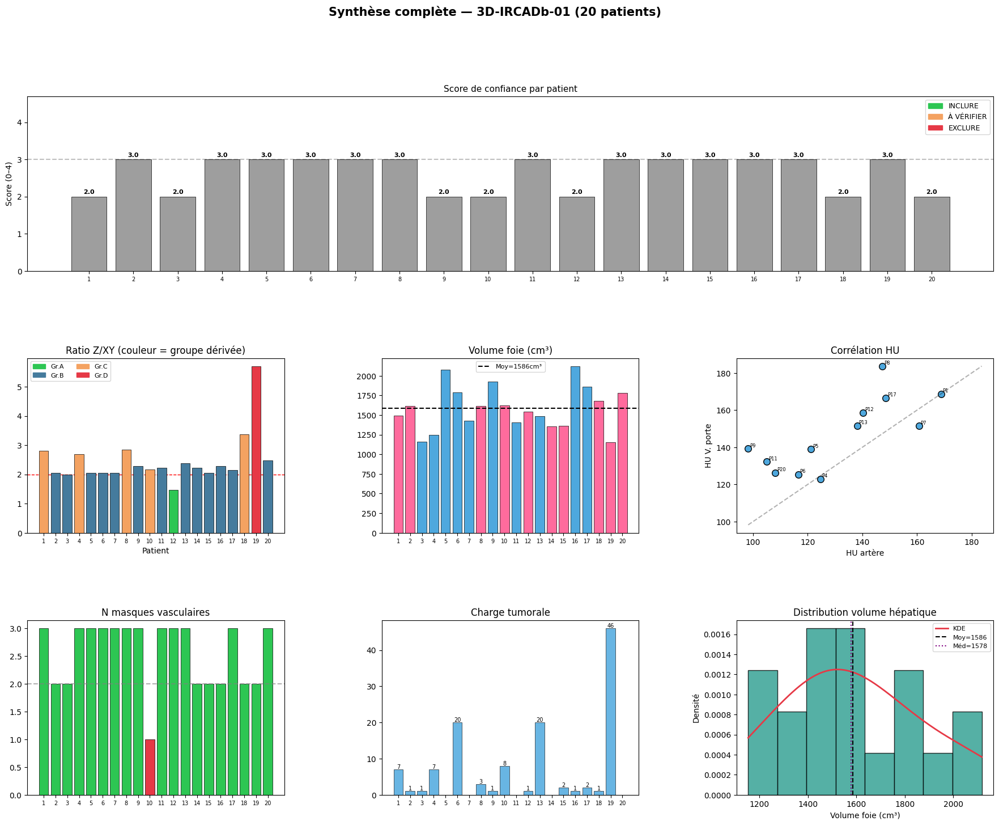

In [ ]:

# ─────────────────────────────────────────────
# RESET STYLE (évite gris forcé / seaborn)
# ─────────────────────────────────────────────
plt.rcParams.update(plt.rcParamsDefault)
plt.style.use('default')

# ─────────────────────────────────────────────
# 🎨 SAFE COLORS
# ─────────────────────────────────────────────
cat_colors = {
    'INCLURE': '#2DC653',
    'À VÉRIFIER': '#F4A261',
    'EXCLURE': '#E63946'
}
fallback_color = '#9E9E9E'

def safe_map(val, mapping, default=fallback_color):
    return mapping.get(val, default)

pids_all = df_synthesis.index.tolist()

# ─────────────────────────────────────────────
# 🎯 FIGURE
# ─────────────────────────────────────────────
fig = plt.figure(figsize=(22, 16), constrained_layout=False)
gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.5, wspace=0.38)

fig.suptitle(
    'Synthèse complète — 3D-IRCADb-01 (20 patients)',
    fontsize=15,
    fontweight='bold'
)

# =========================================================
# 1. SCORE CONFIANCE
# =========================================================
ax = fig.add_subplot(gs[0, :])

scores = df_synthesis['score_confiance'].fillna(0)
bar_colors = [safe_map(c, cat_colors) for c in df_synthesis['cat'].fillna('EXCLURE')]

ax.bar(pids_all, scores, color=bar_colors, edgecolor='black', linewidth=0.5, zorder=3)

ax.set_ylim(0, 4.7)
ax.set_ylabel('Score (0–4)')
ax.set_title('Score de confiance par patient', fontsize=11)
ax.axhline(3, color='gray', linestyle='--', alpha=0.5)

ax.set_xticks(pids_all)
ax.tick_params(axis='x', labelsize=7)

ax.legend(
    handles=[mpatches.Patch(color=c, label=k) for k, c in cat_colors.items()],
    loc='upper right',
    fontsize=9
)

for pid, s in zip(pids_all, scores):
    ax.text(pid, s + 0.07, f"{s:.1f}", ha='center', fontsize=8, fontweight='bold')

# =========================================================
# 2. RATIO Z/XY
# =========================================================
ax = fig.add_subplot(gs[1, 0])

ratio = df_synthesis['ratio_Z/XY'].fillna(0)

grp_bar_colors = [
    GRP_COLORS.get(df_strat.loc[p, 'groupe'], fallback_color)
    if p in df_strat.index else fallback_color
    for p in pids_all
]

ax.bar(pids_all, ratio, color=grp_bar_colors, edgecolor='black', linewidth=0.5, zorder=3)
ax.axhline(2, color='red', linestyle='--', lw=1)

ax.set_title('Ratio Z/XY (couleur = groupe dérivée)')
ax.set_xlabel('Patient')
ax.set_xticks(pids_all)
ax.tick_params(axis='x', labelsize=7)

ax.legend(
    handles=[mpatches.Patch(color=c, label=f'Gr.{k}') for k, c in GRP_COLORS.items()],
    fontsize=8, ncol=2
)

# =========================================================
# 3. VOLUME FOIE
# =========================================================
ax = fig.add_subplot(gs[1, 1])

foie_vals = df_synthesis['foie_cm3'].replace(0, np.nan)
sex_colors = ['#FF6B9D' if s == 'F' else '#4EA8DE'
              for s in df_synthesis['sexe'].fillna('M')]

ax.bar(pids_all, foie_vals.fillna(0),
       color=sex_colors,
       edgecolor='black',
       linewidth=0.5)

valid = foie_vals.dropna()
if len(valid) > 0:
    mean_val = valid.mean()
    ax.axhline(mean_val, color='black', linestyle='--', lw=1.5,
               label=f'Moy={mean_val:.0f}cm³')
    ax.legend(fontsize=8)

ax.set_title('Volume foie (cm³)')
ax.set_xticks(pids_all)
ax.tick_params(axis='x', labelsize=7)

# =========================================================
# 4. SCATTER HU
# =========================================================
ax = fig.add_subplot(gs[1, 2])

if {'artery_hu_mean', 'portalvein_hu_mean'}.issubset(df_hu.columns):

    both = df_hu[['artery_hu_mean', 'portalvein_hu_mean']].dropna()

    ax.scatter(
        both['artery_hu_mean'],
        both['portalvein_hu_mean'],
        c='#4EA8DE',
        s=70,
        edgecolors='black'
    )

    for idx, row in both.iterrows():
        ax.annotate(f'P{idx}', (row['artery_hu_mean'], row['portalvein_hu_mean']),
                    fontsize=6, xytext=(2, 2), textcoords='offset points')

    minv = min(both.min())
    maxv = max(both.max())
    ax.plot([minv, maxv], [minv, maxv], 'k--', alpha=0.3)

ax.set_xlabel('HU artère')
ax.set_ylabel('HU V. porte')
ax.set_title('Corrélation HU')

# =========================================================
# 5. MASQUES VASCULAIRES
# =========================================================
ax = fig.add_subplot(gs[2, 0])

n_vx = df_synthesis['n_masques_vx'].fillna(0)

ax.bar(
    pids_all,
    n_vx,
    color=['#2DC653' if n >= 2 else '#E63946' for n in n_vx],
    edgecolor='black',
    linewidth=0.5
)

ax.axhline(2, color='gray', linestyle='--', alpha=0.6)
ax.set_title('N masques vasculaires')
ax.set_xticks(pids_all)
ax.tick_params(axis='x', labelsize=7)

# =========================================================
# 6. TUMEURS
# =========================================================
ax = fig.add_subplot(gs[2, 1])

n_tum = df_synthesis['n_tumeurs'].fillna(0)

ax.bar(
    pids_all,
    n_tum,
    color='#4EA8DE',
    edgecolor='black',
    linewidth=0.5,
    alpha=0.85
)

ax.set_title('Charge tumorale')
ax.set_xticks(pids_all)
ax.tick_params(axis='x', labelsize=7)

for p, t in zip(pids_all, n_tum):
    if t > 0:
        ax.text(p, t + 0.2, str(int(t)), ha='center', fontsize=7)

# =========================================================
# 7. DISTRIBUTION FOIE
# =========================================================
ax = fig.add_subplot(gs[2, 2])

foie_data = df_synthesis['foie_cm3'].replace(0, np.nan).dropna()

if len(foie_data) > 1:
    ax.hist(
        foie_data,
        bins=8,
        color='#2A9D8F',
        edgecolor='black',
        alpha=0.8,
        density=True
    )

    kde_x = np.linspace(foie_data.min(), foie_data.max(), 200)
    kde = stats.gaussian_kde(foie_data)

    ax.plot(kde_x, kde(kde_x), color='#E63946', lw=2, label='KDE')

    ax.axvline(foie_data.mean(), color='black', lw=1.5, linestyle='--',
               label=f'Moy={foie_data.mean():.0f}')
    ax.axvline(foie_data.median(), color='purple', lw=1.5, linestyle=':',
               label=f'Méd={foie_data.median():.0f}')

    ax.legend(fontsize=8)

ax.set_xlabel('Volume foie (cm³)')
ax.set_ylabel('Densité')
ax.set_title('Distribution volume hépatique')

# ─────────────────────────────────────────────
#  SAVE + DISPLAY
# ─────────────────────────────────────────────
plt.savefig('fig_06_synthesis_final.png', bbox_inches='tight', dpi=150)
plt.show()

## 7. Export CSV

In [ ]:
# ── Export CSV ────────────────────────────────────────────────────────────────
exports = {
    'ircadb_synthesis_table.csv'             : df_synthesis.drop(columns='cat', errors='ignore'),
    'ircadb_geometry_table.csv'              : df_geom,
    'ircadb_mask_stats_table.csv'            : df_stats,
    'ircadb_derivative_stratification.csv'   : df_strat,
    'ircadb_hu_statistics.csv'               : df_hu,
    'ircadb_spatial_compatibility.csv'       : df_compat,
    'ircadb_anomaly_table.csv'               : df_anomaly,
    'ircadb_structure_registry.csv'          : pd.DataFrame(
        [(pid, ','.join(names)) for pid, names in structure_registry.items()],
        columns=['patient','structures_present']).set_index('patient'),
}

print("Fichiers exportés :")
for fname, df_exp in exports.items():
    df_exp.to_csv(fname)
    print(f"  ✓ {fname:<50} ({len(df_exp)} lignes)")


Fichiers exportés :
  ✓ ircadb_synthesis_table.csv                         (20 lignes)
  ✓ ircadb_geometry_table.csv                          (20 lignes)
  ✓ ircadb_mask_stats_table.csv                        (20 lignes)
  ✓ ircadb_derivative_stratification.csv               (20 lignes)
  ✓ ircadb_hu_statistics.csv                           (20 lignes)
  ✓ ircadb_spatial_compatibility.csv                   (20 lignes)
  ✓ ircadb_anomaly_table.csv                           (20 lignes)
  ✓ ircadb_structure_registry.csv                      (20 lignes)


In [ ]:

VESSEL_RADII_MM = (1.0, 7.0)   # anatomie hépatique, union des 3 structures
N_SCALES_LOG    = 6             # log-uniforme

def frangi_params_from_spacing(vx: float, vy: float, vz: float) -> dict:
    vx_iso = (vx * vy * vz) ** (1/3)
    ratio  = vz / ((vx + vy) / 2)
    
    r_min, r_max = VESSEL_RADII_MM
    scale_min = r_min / vx_iso   # voxels
    scale_max = r_max / vx_iso   # voxels
    scales    = np.logspace(np.log10(scale_min),
                            np.log10(scale_max),
                            N_SCALES_LOG).tolist()
    
    sigma_pre = 0.5 if ratio > 2.5 else 0.0
    
    return dict(
        vx_iso=round(vx_iso, 4),
        ratio_z_xy=round(ratio, 2),
        scales=scales,           # en voxels, à passer à Frangi
        scale_min_mm=r_min,
        scale_max_mm=r_max,
        sigma_pre=sigma_pre,
        alpha=0.5,
        beta=0.5,
        black_ridges=False,      # vaisseaux brillants post-contraste portal
    )